# Code for predition 1D simulation results based on input parameters

### Data prepare 
#### Convert a matlab matrix to csv data.
 Data contains a matrix of row of sample number, colums [Input + output]

In [2]:

import numpy as np
import scipy.io as sio
import pandas as pd


train_percentage = 0.9 # 90% for training and 10% for validation

# load data from matlab data
matfn = 'train_prep_051222.mat'
data = sio.loadmat(matfn)
total_data = data ['trainprep050622']
total_data = pd.DataFrame(total_data)

print('total_data_shape' + str(total_data.shape))

total_size = len(total_data)
train_size = int(train_percentage * len(total_data))

print('train_size=' + str(train_size))
print('tota_size=' + str(total_size))
train_data = total_data[:train_size]
val_data = total_data[train_size:]
train_data.to_csv('train_data.csv', header=False, index=False)
val_data.to_csv('val_data.csv', header=False, index=False)

total_data_shape(8471, 2691)
train_size=7623
tota_size=8471


## Input data type csv

In [1]:
import os
import numpy as np
import torch
import torch.utils.data as data
import pandas as pd
import matplotlib.pyplot as plt
import torch.nn as nn
from mpl_toolkits.mplot3d import Axes3D
import scipy.io as sio


def normalized_data(data):
    data = torch.FloatTensor(data)
    data[data<1e-8]=1e-8
    data = torch.log10(data)
    data /=10 
    
    # maxdata = 2.1928e-06
    # mindata = -3.0683e-06
    # data = (data-mindata)/(maxdata-mindata)
    
    return data


class CSVdata(data.Dataset):

    def __init__(self,data_path,num_inputs,num_outputs):
        self.num_inputs = num_inputs
        self.num_outputs = num_outputs
        data = pd.read_csv(data_path,header = None)
        data = data.iloc[:,:].to_numpy()
        # data = torch.FloatTensor(data)
        data = normalized_data(data)
        self.input_par= data[:,:self.num_inputs].clone()
        self.target = data[:,self.num_inputs:self.num_inputs+self.num_outputs].clone()
        
        
    def __getitem__(self, index):
        return self.input_par[index],self.target[index]

    def __len__(self):
        return self.target.size(0)

## Simple Model

In [2]:


class ModelSimple(nn.Module):
    
    def __init__(self, num_inputs,num_outputs):
        super(ModelSimple, self).__init__()
        nodes = 512
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout()
        self.fc1 = nn.Linear(num_inputs, nodes)
        self.fc2 = nn.Linear(nodes, 2*nodes)
        self.fc3 = nn.Linear(2*nodes, 4*nodes)
        self.fc4 = nn.Linear(4*nodes, nodes)
        self.fc5 = nn.Linear(nodes, num_outputs)

    def forward(self, x):

        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.relu(self.fc3(x))
        x = self.relu(self.fc4(x))
        x = self.fc5(x)

        return x

In [3]:
class ModelLSTM(nn.Module):
    
    def __init__(self,num_inputs,num_outputs):
        super(ModelLSTM, self).__init__()
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout()
        self.fc1 = nn.Linear(num_inputs, 511)
        self.fc2 = nn.Linear(512, 1)
        self.lstm = nn.LSTMCell(512, 512)
        self.number_output = num_outputs
        
        
        # self.lstm = nn.LSTM(num_inputs,num_outputs)
        # self.output= torch.zeros(num_outputs)

    def forward(self, x):

        batch_size = x.size()[0]
        results= torch.zeros(batch_size,self.number_output)
        # print(results.size(dim = 0))
        emb = self.relu(self.fc1(x))
        # print(x.size())
        x = (torch.ones(x.size(0), 1) * (-0.8))
        hx = torch.zeros(x.size(0), 512)
        cx = torch.zeros(x.size(0), 512)
        for t in range(self.number_output):
            x = torch.cat((emb, x), 1)
            hx, cx = self.lstm(x, (hx, cx))
            x = self.fc2(hx)
            # print(x.size())
            results[:,t] = x[:,0]
            #print(results.size())
            x = x.detach()
        # results = results[:,3:-1]
        # print(results.size())
        return results

## Progess Check

In [4]:
def save_checkpoint(state, is_best, filename='checkpoint.pth.tar'):
    torch.save(state, filename)
    if is_best:
        shutil.copyfile(filename, 'model_best.pth.tar')


class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self, name, fmt=':f'):
        self.name = name
        self.fmt = fmt
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

    def __str__(self):
        fmtstr = '{name} {avg' + self.fmt + '}'
        #print(self.__dict__)
        return fmtstr.format(**self.__dict__)


class ProgressMeter(object):
    def __init__(self, num_batches, meters, prefix=""):
        self.batch_fmtstr = self._get_batch_fmtstr(num_batches)
        self.meters = meters
        self.prefix = prefix

    def display(self, batch):
        entries = [self.prefix + self.batch_fmtstr.format(batch)]
        entries += [str(meter) for meter in self.meters]
        print('\t'.join(entries))

    def _get_batch_fmtstr(self, num_batches):
        num_digits = len(str(num_batches // 1))
        fmt = '{:' + str(num_digits) + 'd}'
        return '[' + fmt + '/' + fmt.format(num_batches) + ']'


def adjust_learning_rate(optimizer, epoch, lr):
    """Sets the learning rate to the initial LR decayed by 10 every 30 epochs"""
    lr = lr * (0.1 ** (epoch // 30))
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

# code for plot Zebrafish data

In [5]:
def show_data(real_tensor,predict_tensor, num_data=3):
    '''
    Function for visualizing training sample and predict result for 1D data
    '''
    real = real_tensor[:num_data].detach().cpu()
    predict = predict_tensor[:num_data].detach().cpu()

    fig, axs = plt.subplots(1,num_data)
    x = np.arange(0,real.size(dim=1), 1 )
    print(real.size())
    
    for i in range(num_data):
        
        axs[i].plot(predict[i],label = ['predicted'])
        # axs[i].plot(real[i],label = ['real'])
        print(len(real[i]))
        axs[i].scatter(x, real[i], c ="blue")
        plt.legend(loc="upper left")

    plt.show()

In [11]:

def show_data_3D(real_tensor,predict_tensor, num_data=3):
    '''
    Function for visualizing training sample and predict result for 3D data
    '''
    real = real_tensor[:num_data].detach().cpu()
    predict = predict_tensor[:num_data].detach().cpu()

    # print(real.size())
    # read coordinate data from matlab data
    matfn = 'output_coordinates.mat'
    data = sio.loadmat(matfn)
    total_x = pd.DataFrame(data ['total_x'])
    total_y = pd.DataFrame(data ['total_y'])
    total_z = pd.DataFrame(data ['total_z'])

    
    
    node_1 = 484
    node_2 = 1109 # 5.3 node 625
    node_3 = 1837 # 5.7 node 728
    # node_4 = 827

    x_47 = total_x[:node_1]
    x_53 = total_x[node_1:node_2]
    x_57 = total_x[node_2:node_3]
    x_63 = total_x[node_3:]

    y_47 = total_y[:node_1]
    y_53 = total_y[node_1:node_2]
    y_57 = total_y[node_2:node_3]
    y_63 = total_y[node_3:]

    z_47 = total_z[:node_1]
    z_53 = total_z[node_1:node_2]
    z_57 = total_z[node_2:node_3]
    z_63 = total_z[node_3:]

   # get margin coordinate
    min_z_1 = np.min(z_47)+40
    min_z_2 = np.min(z_53)+40
    min_z_3 = np.min(z_57)+40
    min_z_4 = np.min(z_63)+40


    index1 = z_47<min_z_1
    index2 = z_53<min_z_2
    index3 = z_57<min_z_3
    index4 = z_63<min_z_4
    
    x_47_margin = x_47.to_numpy()[index1]
    x_53_margin = x_53.to_numpy()[index2]
    x_57_margin = x_57.to_numpy()[index3]
    x_63_margin = x_63.to_numpy()[index4]
    



    for i in range(num_data):
        reali=real[i]
        

        predicti=predict[i]
        # print(predicti)
        fig = plt.figure(figsize = plt.figaspect(0.5))
        fig1 = plt.figure(figsize = plt.figaspect(0.5))
        fig2 = plt.figure(figsize = plt.figaspect(0.5))

        reali_47 = np.reshape(reali.numpy()[:node_1],(node_1,1))
        reali_53 = np.reshape(reali.numpy()[node_1:node_2],(node_2-node_1,1))
        reali_57 = np.reshape(reali.numpy()[node_2:node_3],(node_3-node_2,1))
        reali_63 = np.reshape(reali.numpy()[node_3:],(827,1))

        predicti_47 = np.reshape(predicti.numpy()[:node_1],(node_1,1))
        predicti_53 = np.reshape(predicti.numpy()[node_1:node_2],(node_2-node_1,1))
        predicti_57 = np.reshape(predicti.numpy()[node_2:node_3],(node_3-node_2,1))
        predicti_63 = np.reshape(predicti.numpy()[node_3:],(827,1))

        reali_47_margin = reali_47[index1]
        reali_53_margin = reali_53[index2]
        reali_57_margin = reali_57[index3]
        reali_63_margin = reali_63[index4]

        predicti_47_margin = predicti_47[index1]
        predicti_53_margin = predicti_53[index2]
        predicti_57_margin = predicti_57[index3]
        predicti_63_margin = predicti_63[index4]
        # print('debug here')
        # print(x_47_margin.shape)
        # print(reali_47_margin.shape)


        # plot the real simulation result
        f1ax1 = fig.add_subplot(1,4,1,projection = '3d')
        im = f1ax1.scatter(x_47,y_47,z_47,c = reali_47,marker = 'o')
        f1ax1 .set_title('simulaiton 4.7hpf')
        f1ax1 .view_init(0.90)

        f1ax2 = fig.add_subplot(1,4,2,projection = '3d')
        im = f1ax2.scatter(x_53,y_53,z_53,c = reali_53,marker = 'o')
        f1ax2 .set_title('simulaiton 5.3hpf')
        f1ax2 .view_init(0.90)

        f1ax3 = fig.add_subplot(1,4,3,projection = '3d')
        im = f1ax3.scatter(x_57,y_57,z_57,c = reali_57,marker = 'o')
        f1ax3 .set_title('simulaiton 5.7hpf')
        f1ax3 .view_init(0.90)

        f1ax4 = fig.add_subplot(1,4,4,projection = '3d')
        im = f1ax4.scatter(x_63,y_63,z_63,c = reali_63,marker = 'o')
        f1ax4 .set_title('simulaiton 6.3hpf')
        f1ax4 .view_init(0.90)


        # plto the predict result
        f2ax1 = fig1.add_subplot(1,4,1,projection = '3d')
        im = f2ax1.scatter(x_47,y_47,z_47,c = predicti_47,marker = 'o')
        f2ax1.set_title('predict 4.7hpf')
        f2ax1.view_init(0.90)

        f2ax2 = fig1.add_subplot(1,4,2,projection = '3d')
        im = f2ax2.scatter(x_53,y_53,z_53,c = predicti_53,marker = 'o')
        f2ax2.set_title('predict 5.3hpf')
        f2ax2.view_init(0.90)

        f2ax3 = fig1.add_subplot(1,4,3,projection = '3d')
        im = f2ax3.scatter(x_57,y_57,z_57, c = predicti_57,marker = 'o')
        f2ax3.set_title('predict 5.7hpf')
        f2ax3.view_init(0.90)

        f2ax4 = fig1.add_subplot(1,4,4,projection = '3d')
        im = f2ax4.scatter(x_63,y_63,z_63, c = predicti_63,marker = 'o')
        f2ax4.set_title('predict 6.3hpf')
        f2ax4.view_init(0.90)

        #plot margin profile
        # plto the predict result
        f3ax1 = fig2.add_subplot(1,4,1)
        f3ax1.plot(x_47_margin,reali_47_margin)
        f3ax1.plot(x_47_margin,predicti_47_margin)
        f3ax1.set_title('margin 4.7hpf')
        # f3ax1.view_init(0)

        f3ax2 = fig2.add_subplot(1,4,2)
        f3ax2.plot(x_53_margin,reali_53_margin)
        f3ax2.plot(x_53_margin,predicti_53_margin)
        f3ax2.set_title('margin 5.3hpf')
        # f3ax2.view_init(0)

        f3ax3 = fig2.add_subplot(1,4,3)
        f3ax3.plot(x_57_margin,reali_57_margin)
        f3ax3.plot(x_57_margin,predicti_57_margin)
        f3ax3.set_title('margin 5.7hpf')
        # f3ax3.view_init(0)

        f3ax4 = fig2.add_subplot(1,4,4)
        f3ax4.plot(x_63_margin,reali_63_margin)
        f3ax4.plot(x_63_margin,predicti_63_margin)
        f3ax4.set_title('margin 6.3hpf')
        # f3ax4.view_init(0)


    plt.show()

In [12]:
def plot_loss(total_gen_loss,total_ssres):
    fig,axs  = plt.subplots(1,2)
    axs[0].plot(total_gen_loss,label="line 1")
    axs[0].title.set_text('Loss')
    axs[1].plot(total_ssres)
    axs[1].title.set_text('MSRE')
    plt.show()

### Train code

In [13]:
def train(train_loader, model, criterion, optimizer, epoch,p_freq, model_type):
    batch_time = AverageMeter('Time', ':6.3f')
    data_time = AverageMeter('Data', ':6.3f')
    losses = AverageMeter('Loss', ':.4e')
    ssres_vals = AverageMeter('SSres', ':.4f')
    r2_scores = AverageMeter('R2', ':.4f')
    progress = ProgressMeter(
        len(train_loader),
        [batch_time, data_time, losses, r2_scores],
        prefix="Train: [{}]".format(epoch))

    mean_loss = 0

    # switch to train mode
    model.train()
    global cur_step
    global total_loss
    global total_ssres
    
    end = time.time()
    for input_par, target in tqdm(train_loader):
        # measure data loading time
        data_time.update(time.time() - end)
        # print(i)
        # inputs = inputs.cuda(args.gpu, non_blocking=True)
        # target = target.cuda(args.gpu, non_blocking=True)


        inputs = input_par
       
        target = target
       

        # compute output
        output = model(inputs)
        # if model_type == 2:
        #     loss = 0.0
        #     for j in range(len(output)):
        #         loss += criterion(output[j], target[:, j].unsqueeze(1))
        #     # output = torch.stack(output)
        #     output = output.squeeze().transpose(0, 1)
        # else:
        #     target = target.view(target.size(0), -1)
  
   

        loss = criterion(output, target)
        ssres = (target - output).pow(2).sum()
        # print(ssres)
        # measure accuracy and record loss
        #ssres = (target - output).pow(2).sum()
        losses.update(loss.item(), inputs.size(0))
        ssres_vals.update(ssres.item(), 1)

        # compute gradient and do SGD step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # measure elapsed time
        batch_time.update(time.time() - end)
        end = time.time()

                # Keep track of the average discriminator loss
        mean_loss += loss.item() / p_freq
        mean_ssres = ssres.item()/ p_freq
        if (cur_step+1) % p_freq == 0:
            # progress.display(i+1)
            
            # print(f"Step {i}:  loss: {loss}")
            total_loss = np.append(total_loss,[mean_loss],axis = 0)
            total_ssres = np.append(total_ssres,[mean_ssres],axis = 0)
            show_data_3D(target, output)
            show_data(target, output)
            plot_loss(total_loss,total_ssres)

        cur_step += 1
        # print(cur_step)


    # r2 = 1.0 - (ssres_vals.sum / sstot)
    # r2_scores.update(r2)  

    # progress.display(i+1)
    

## Main training code

Loading Training Data
Training Data input size
27
Training Data output size
2664
Total Training pairs
7623


  2%|▏         | 2/120 [00:00<00:06, 17.05it/s]

Training Data loaded


 48%|████▊     | 58/120 [00:03<00:03, 16.94it/s]

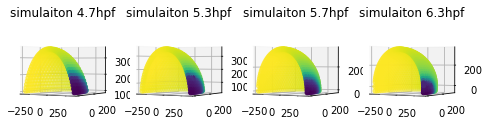

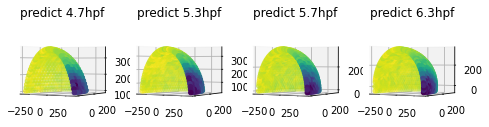

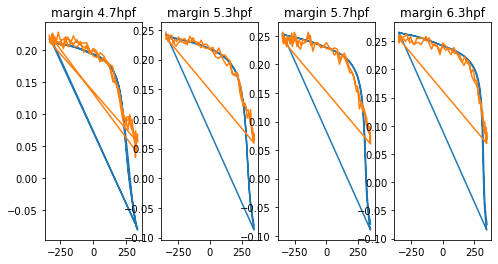

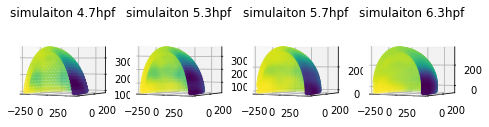

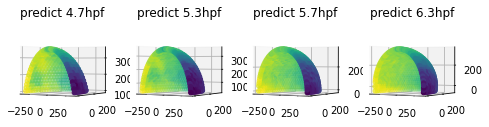

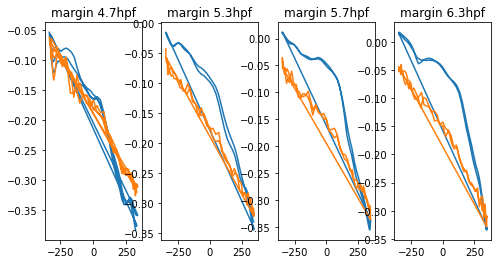

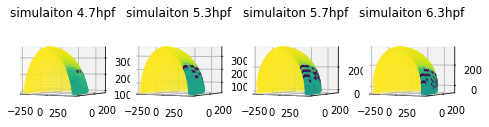

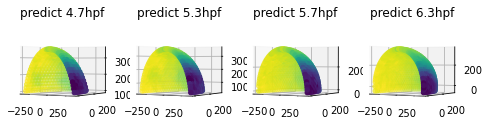

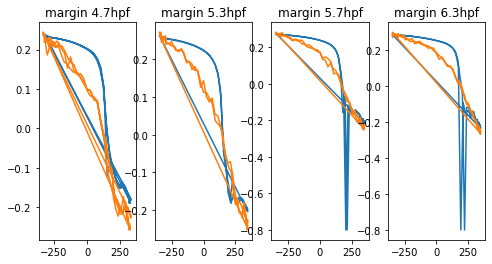

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


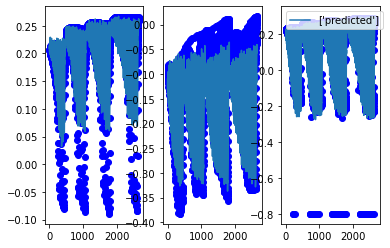

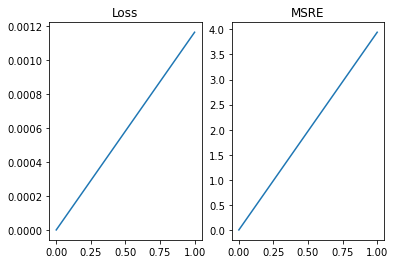

 98%|█████████▊| 118/120 [00:07<00:00, 16.50it/s]

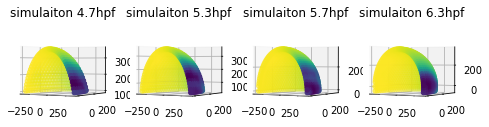

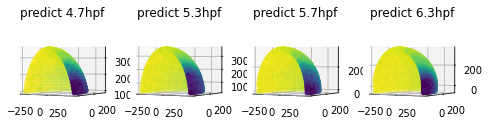

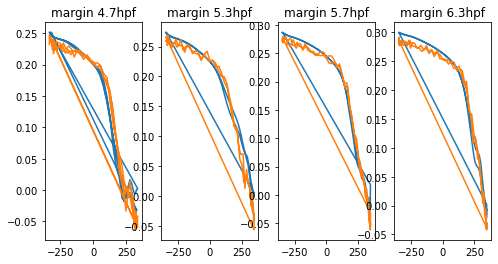

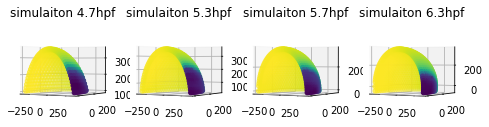

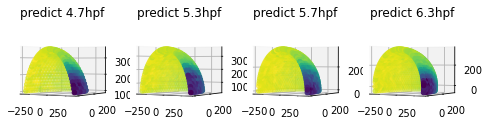

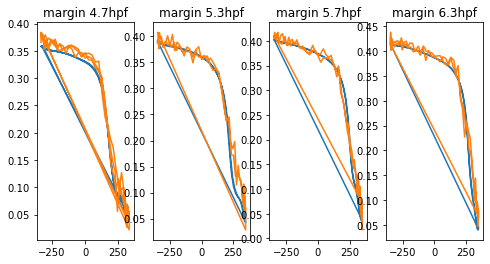

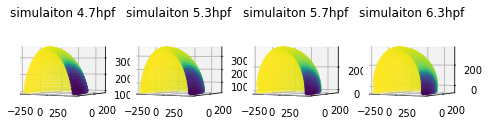

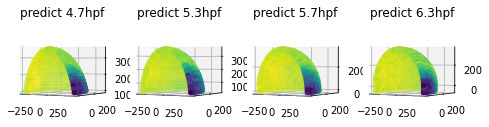

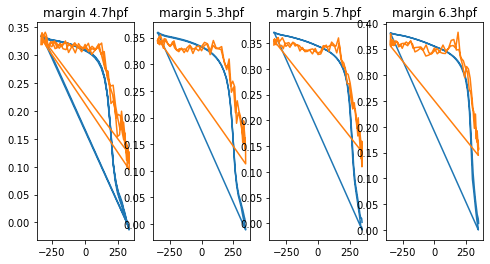

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


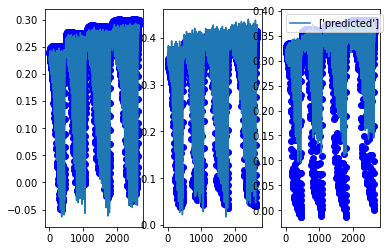

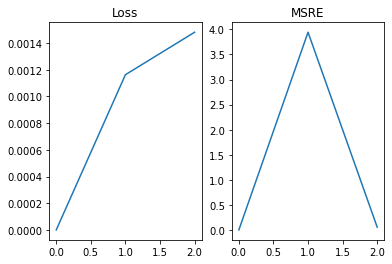

 48%|████▊     | 58/120 [00:03<00:03, 16.19it/s]

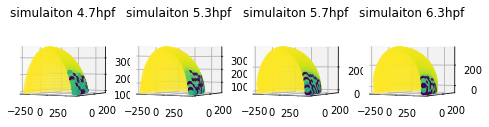

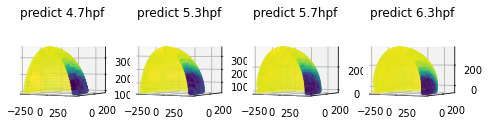

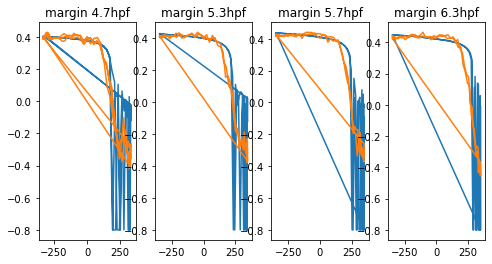

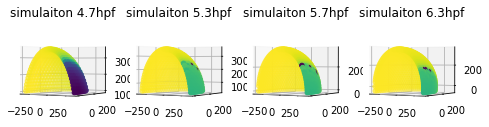

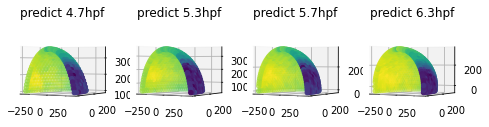

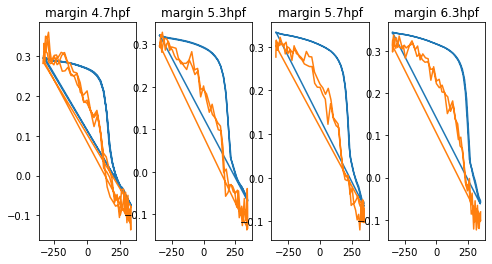

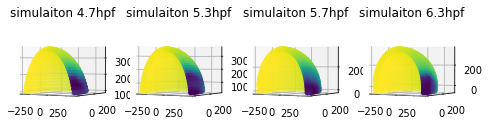

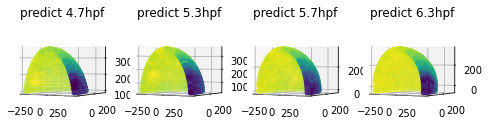

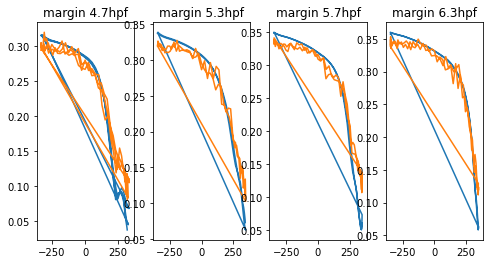

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


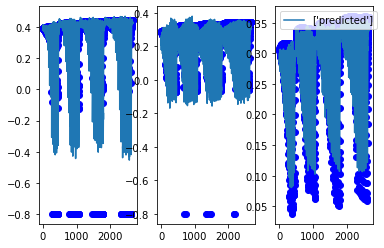

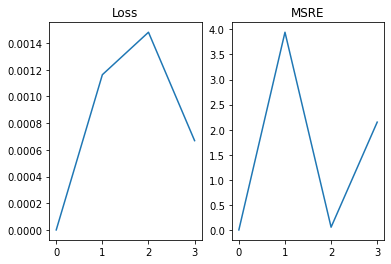

 98%|█████████▊| 118/120 [00:07<00:00, 15.76it/s]

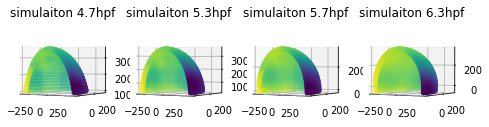

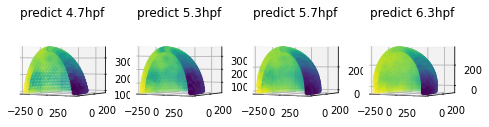

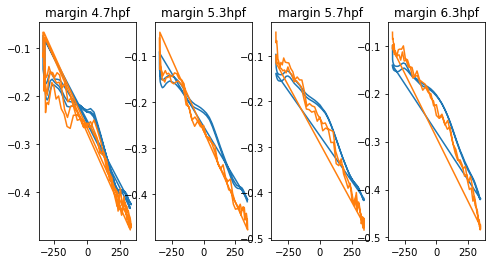

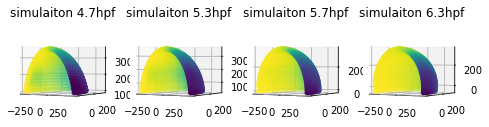

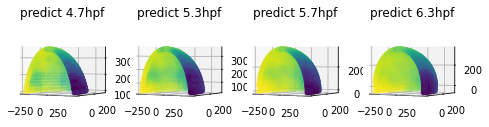

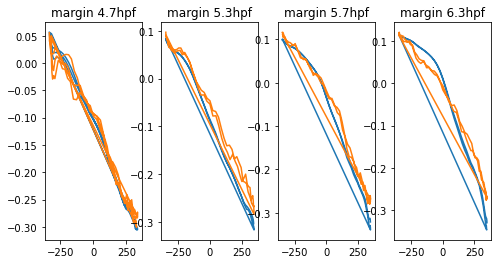

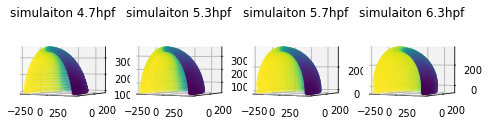

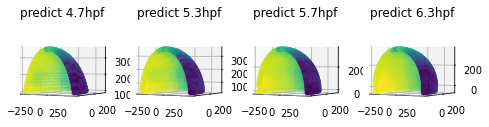

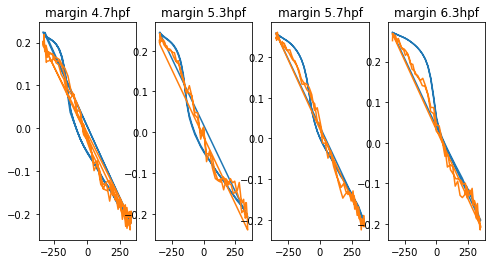

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


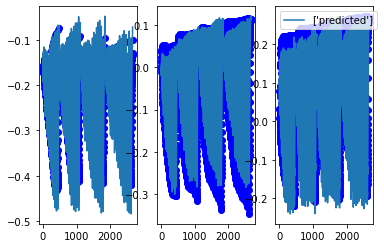

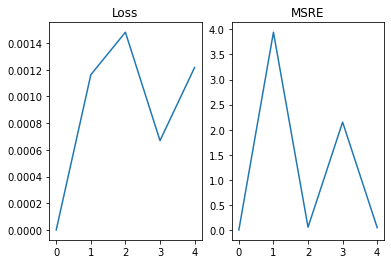

 48%|████▊     | 58/120 [00:03<00:03, 15.57it/s]

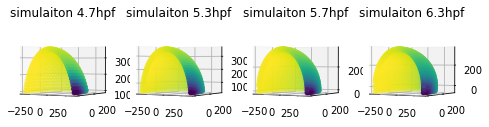

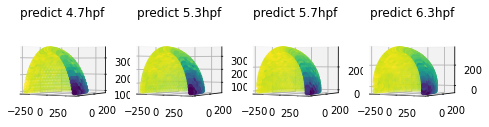

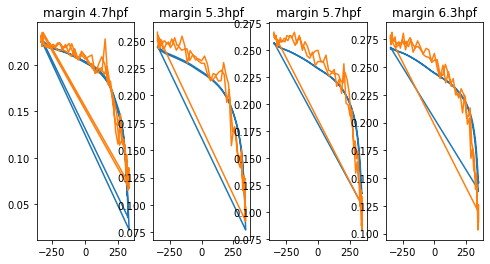

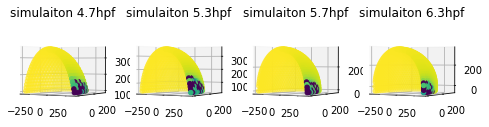

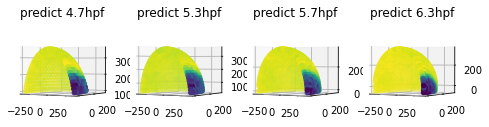

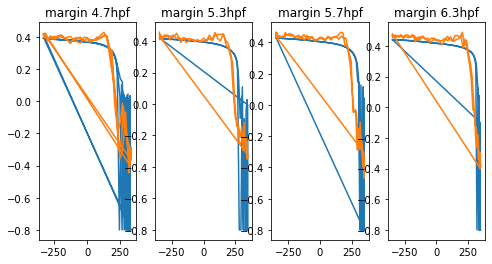

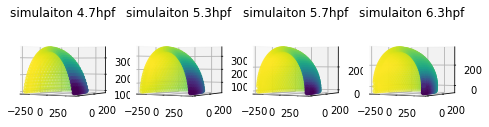

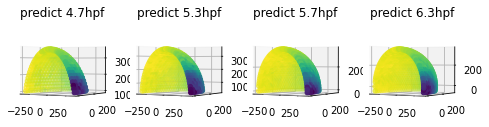

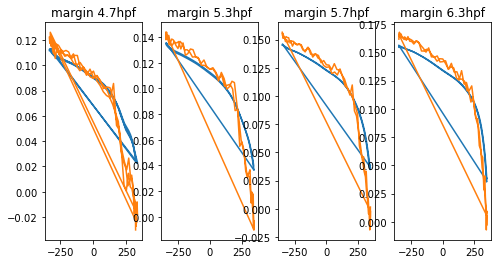

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


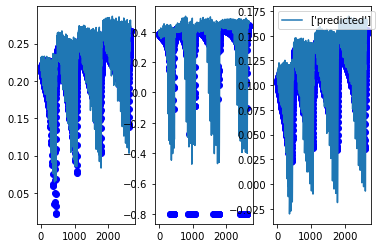

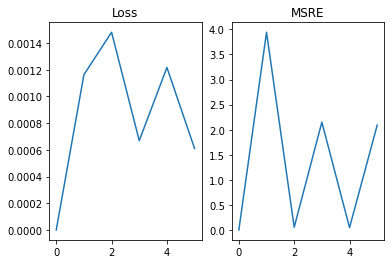

 98%|█████████▊| 118/120 [00:07<00:00, 15.78it/s]

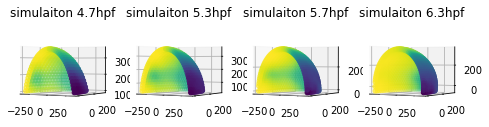

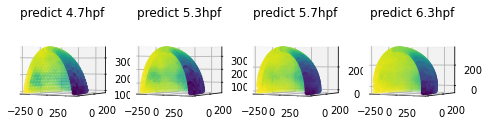

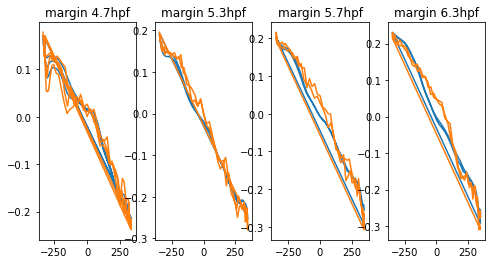

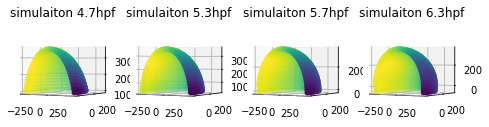

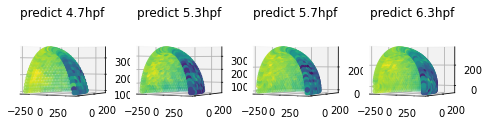

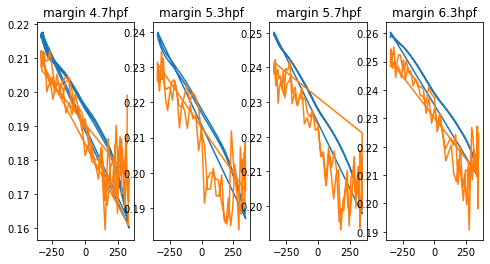

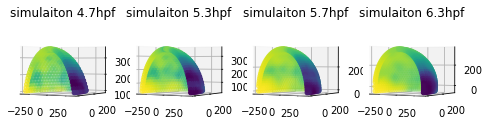

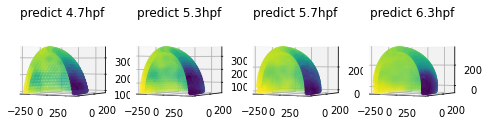

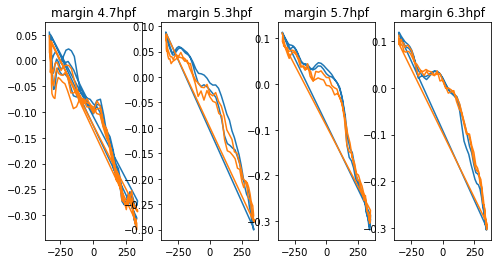

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


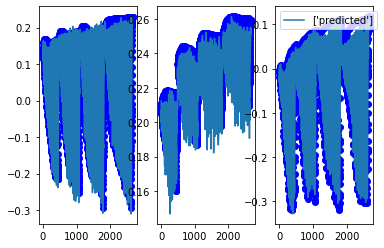

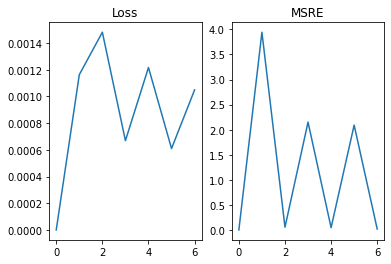

 48%|████▊     | 58/120 [00:03<00:03, 16.13it/s]

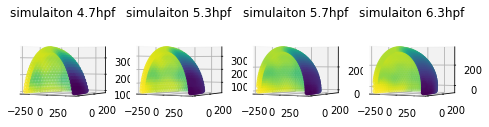

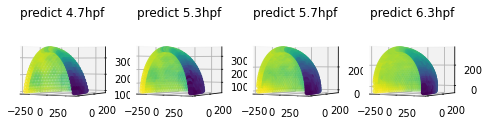

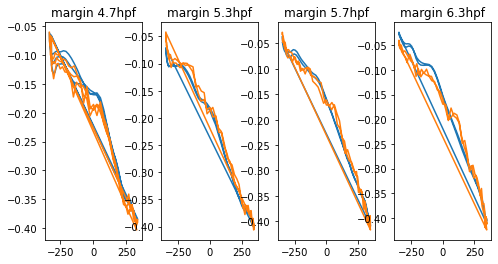

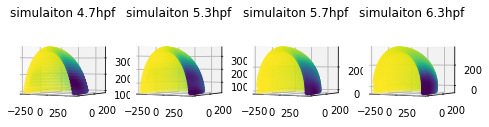

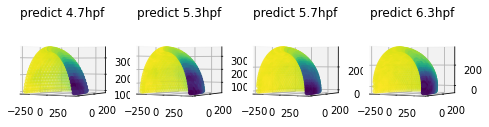

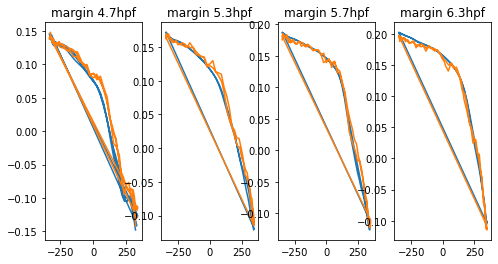

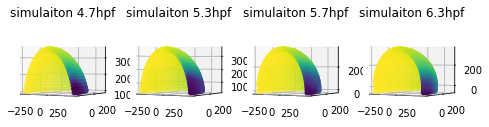

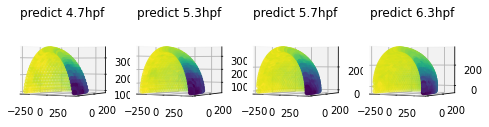

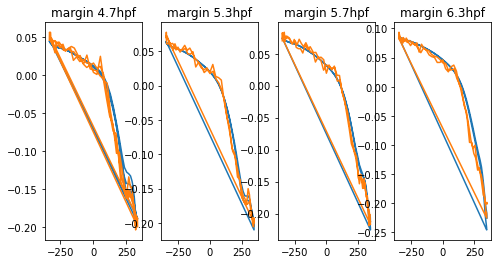

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


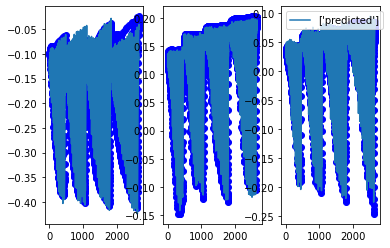

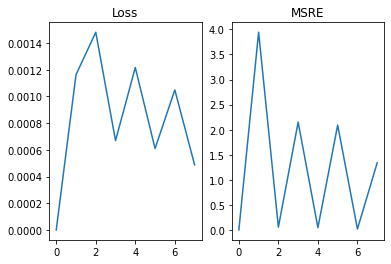

 98%|█████████▊| 118/120 [00:07<00:00, 16.09it/s]

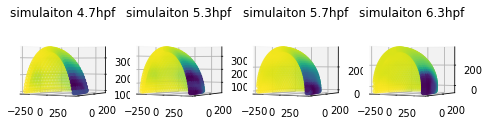

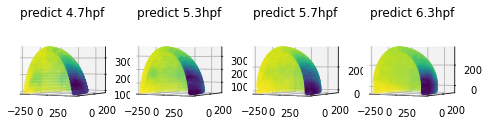

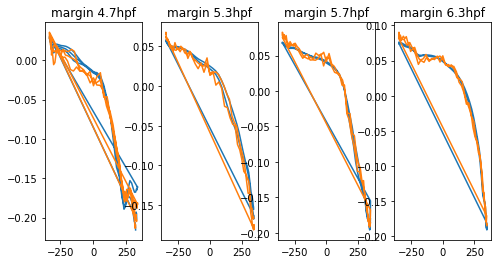

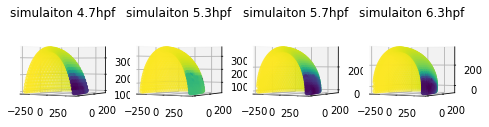

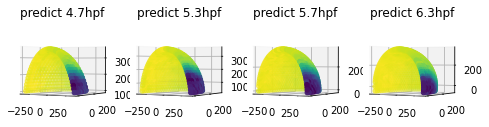

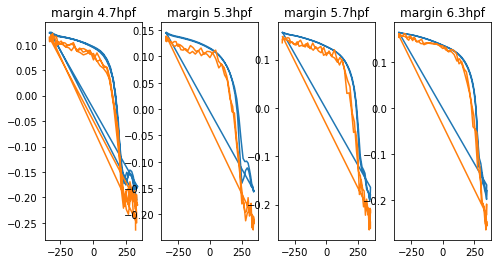

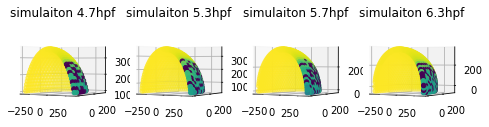

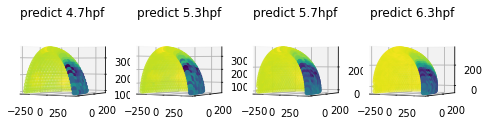

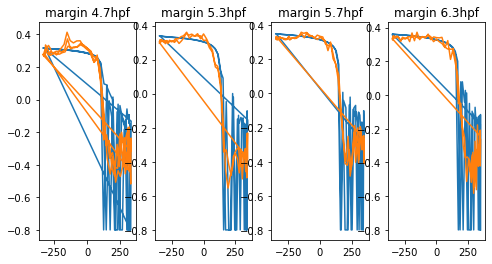

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


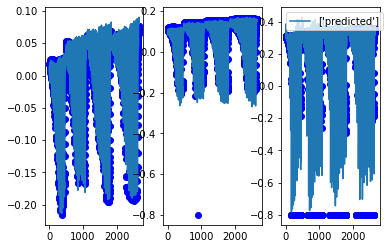

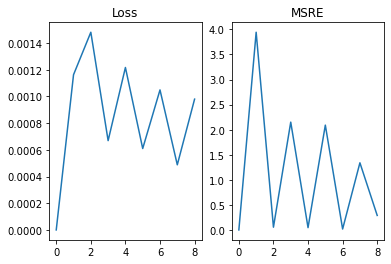

 48%|████▊     | 58/120 [00:03<00:03, 15.59it/s]

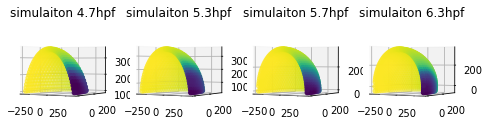

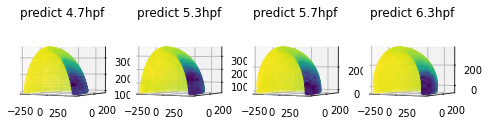

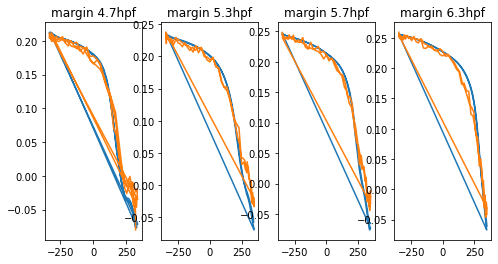

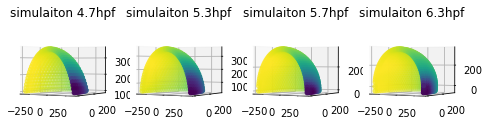

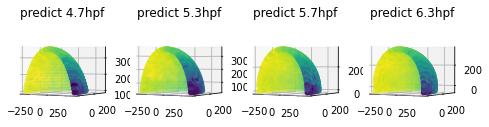

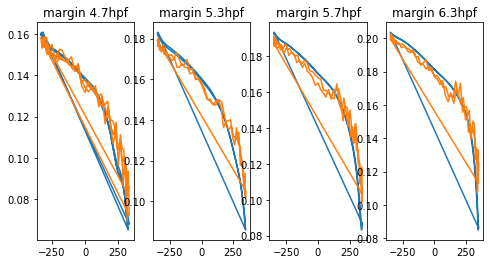

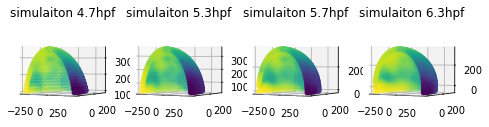

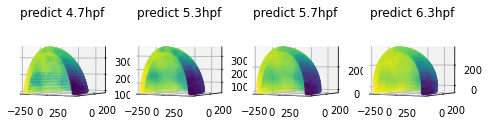

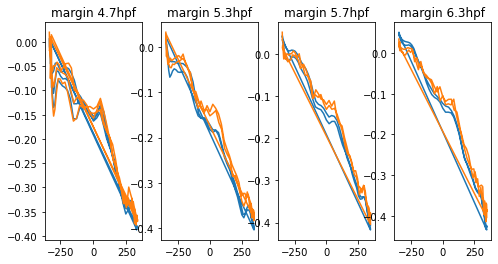

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


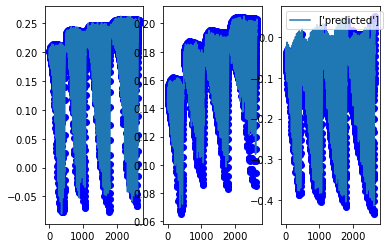

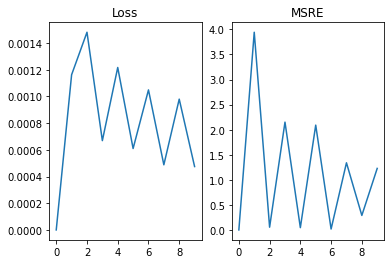

 98%|█████████▊| 118/120 [00:07<00:00, 15.59it/s]

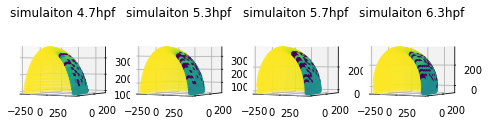

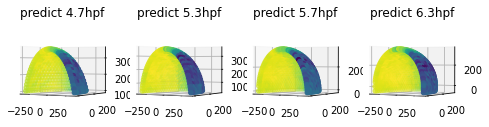

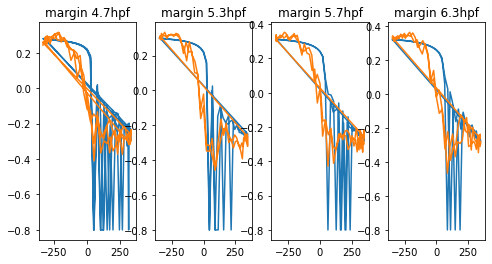

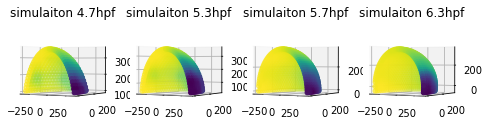

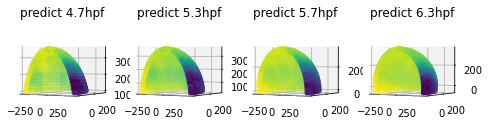

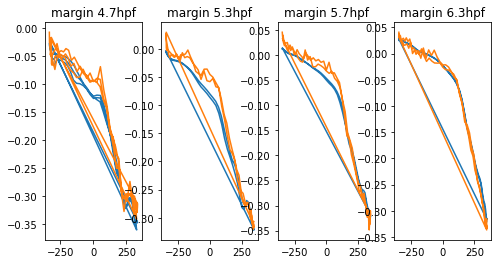

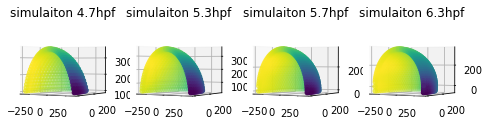

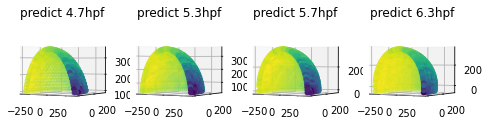

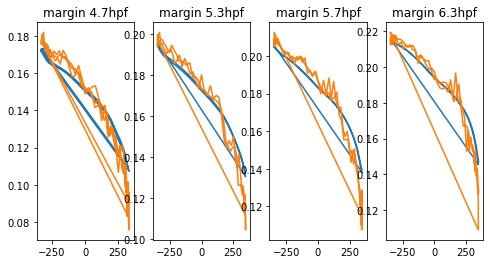

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


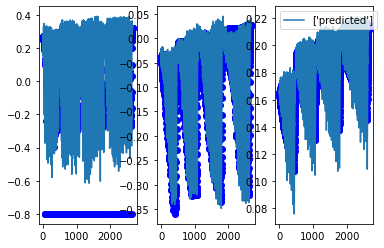

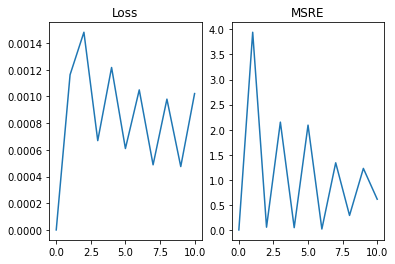

 48%|████▊     | 58/120 [00:03<00:03, 15.76it/s]

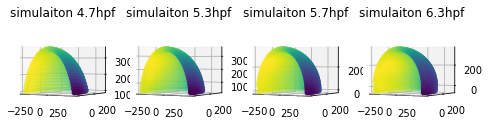

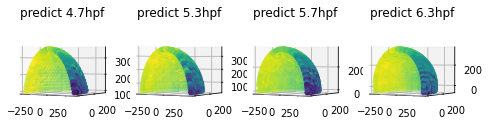

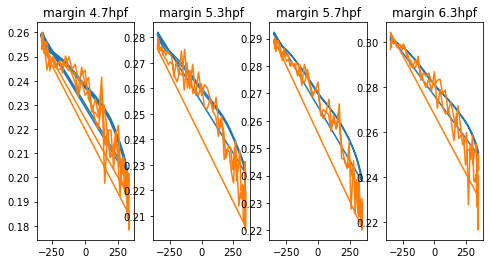

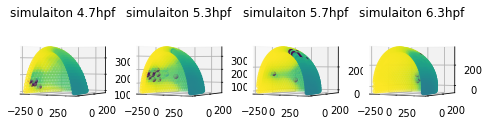

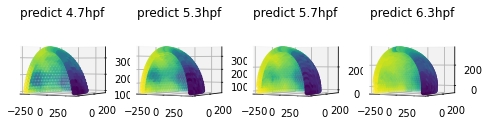

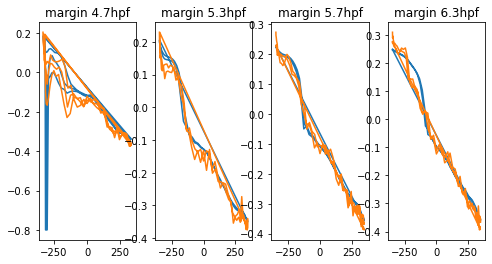

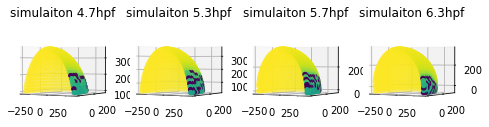

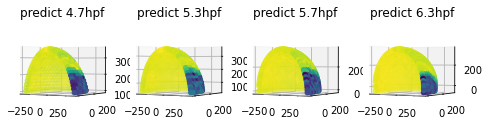

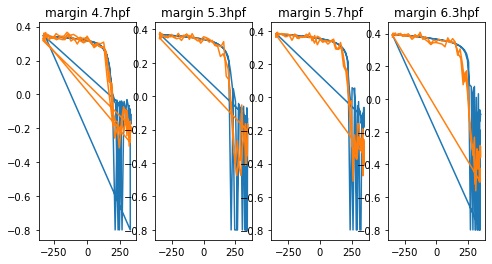

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


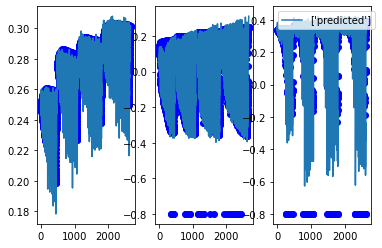

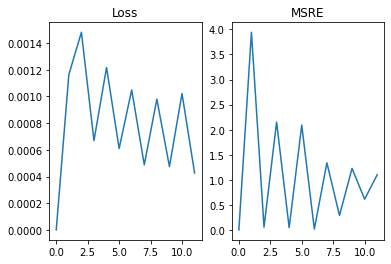

 98%|█████████▊| 118/120 [00:07<00:00, 16.03it/s]

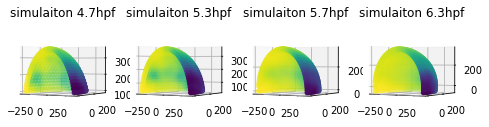

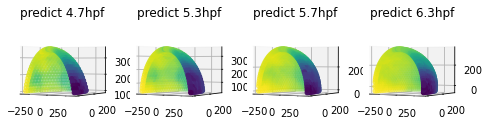

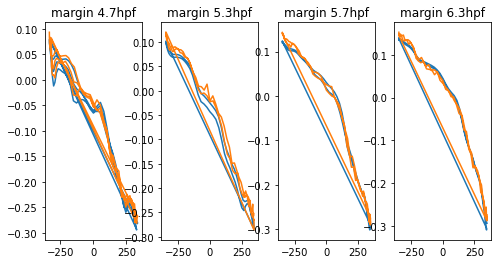

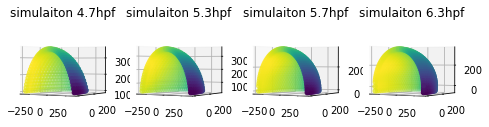

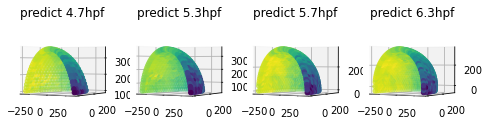

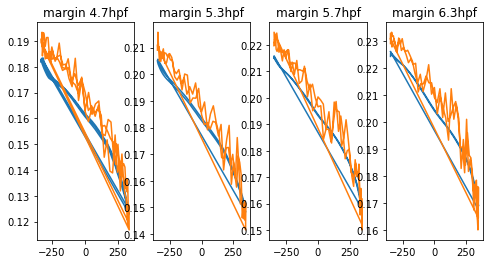

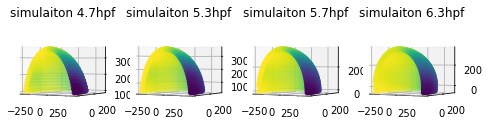

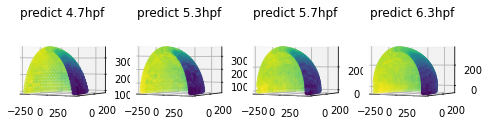

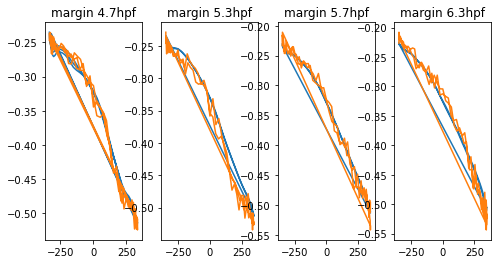

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


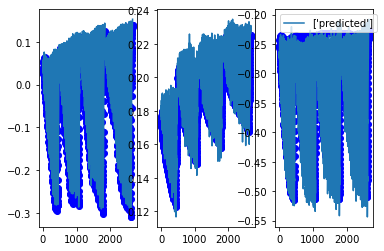

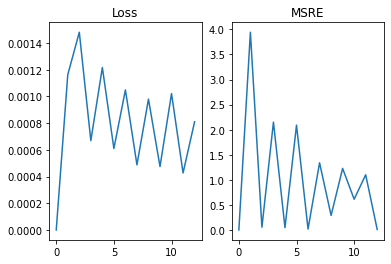

 48%|████▊     | 58/120 [00:03<00:03, 15.81it/s]

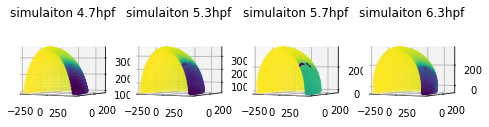

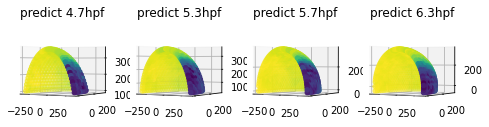

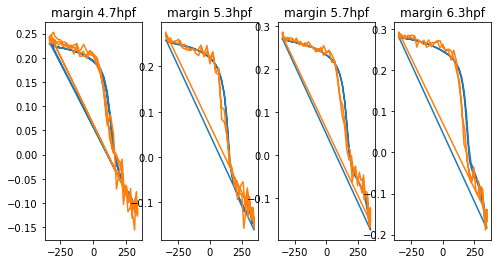

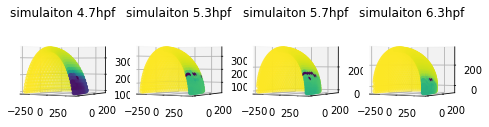

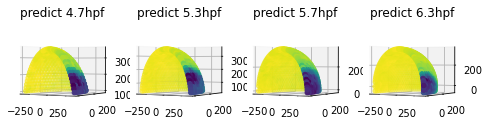

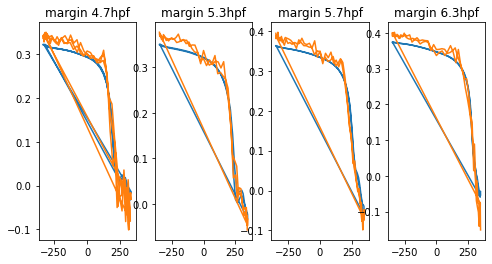

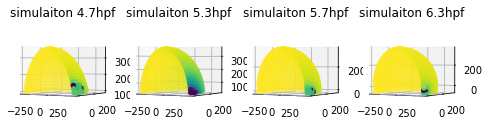

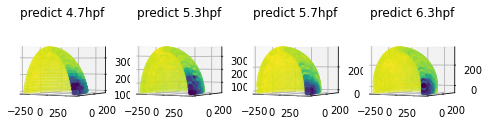

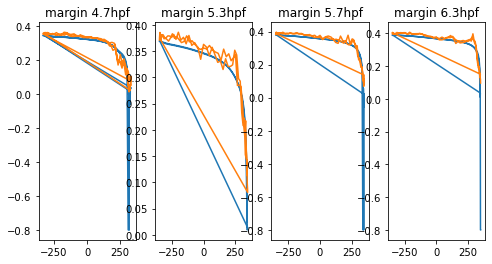

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


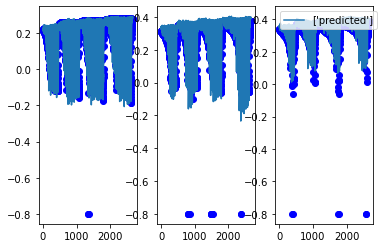

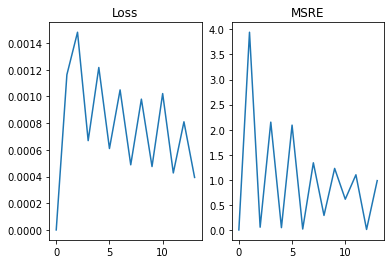

 98%|█████████▊| 118/120 [00:07<00:00, 16.08it/s]

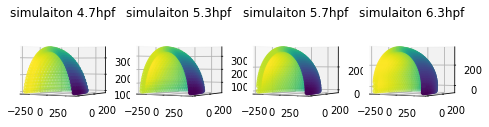

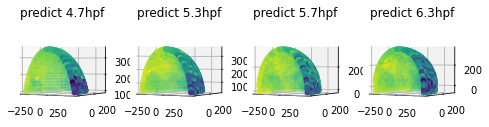

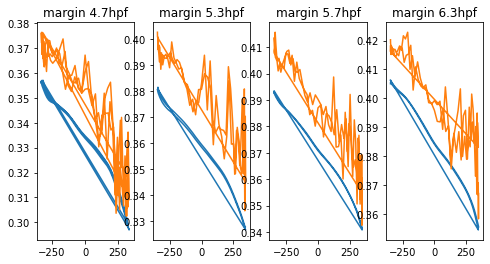

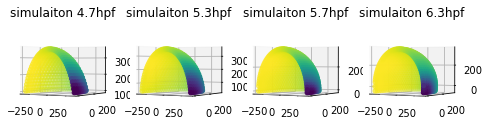

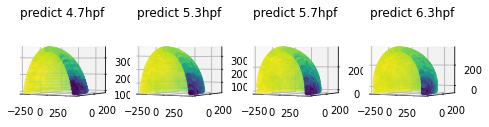

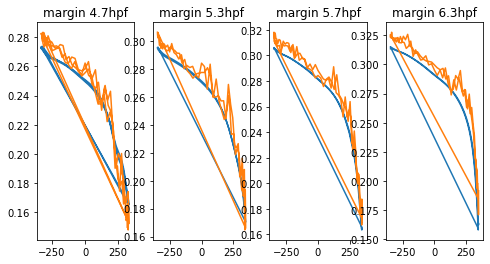

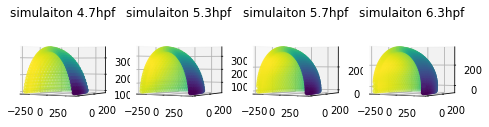

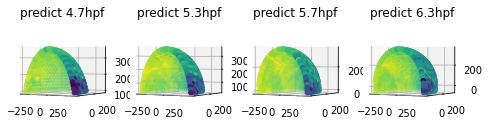

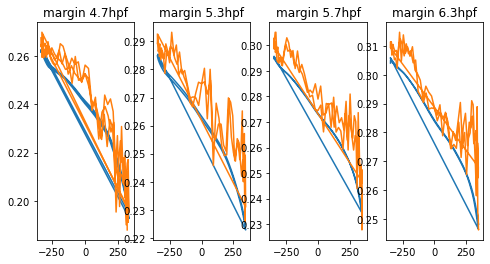

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


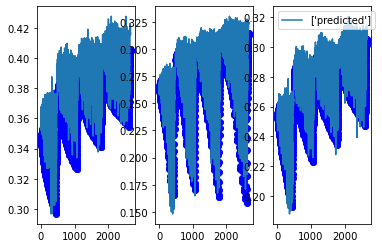

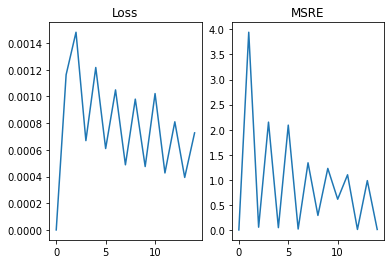

 48%|████▊     | 58/120 [00:03<00:03, 15.69it/s]

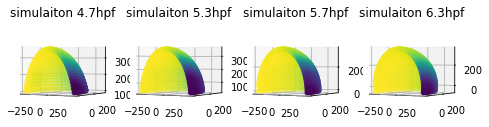

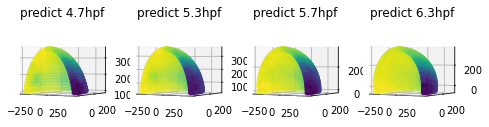

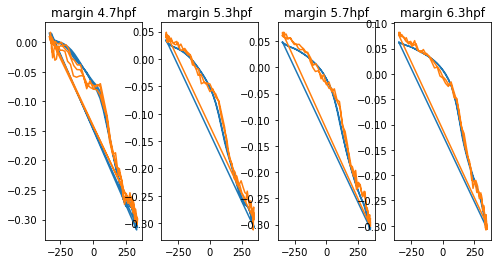

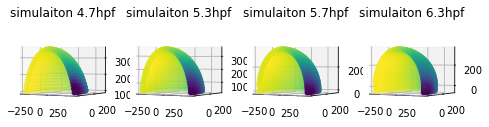

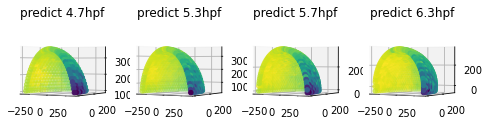

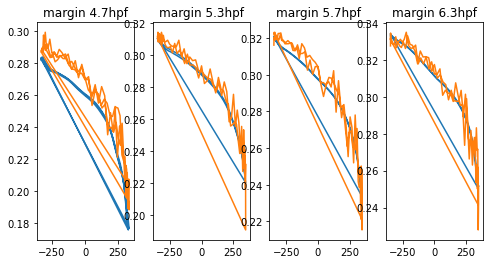

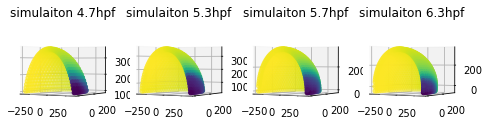

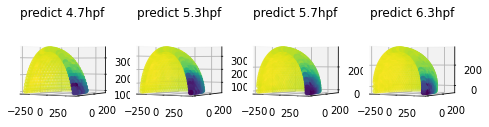

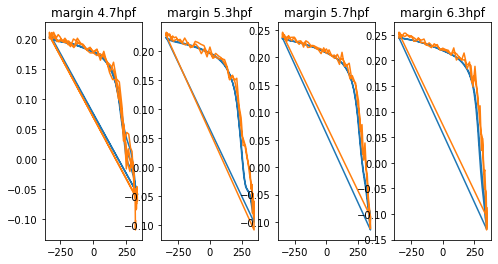

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


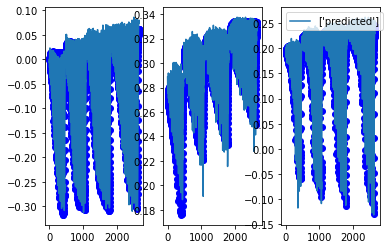

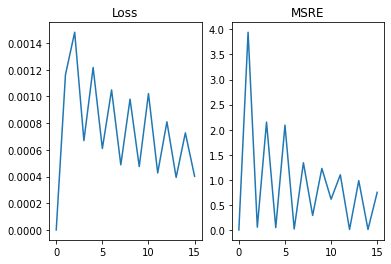

 98%|█████████▊| 118/120 [00:07<00:00, 14.64it/s]

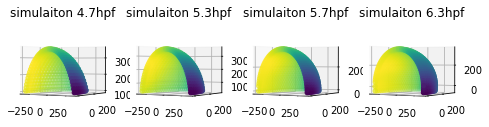

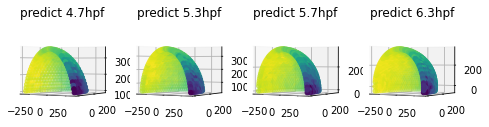

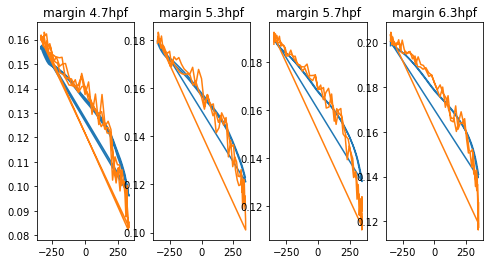

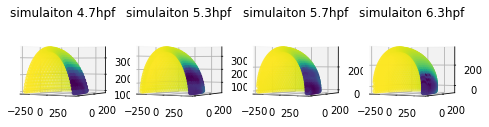

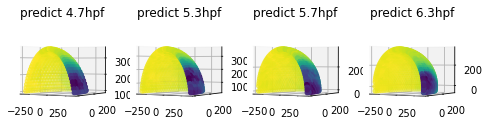

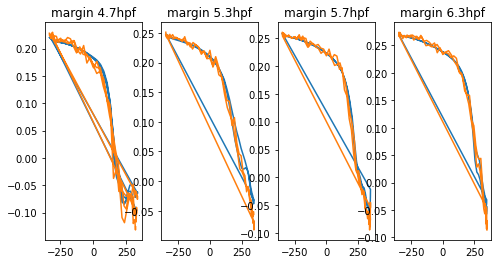

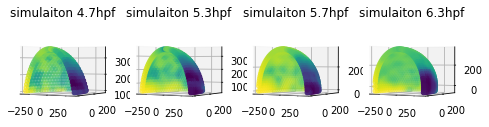

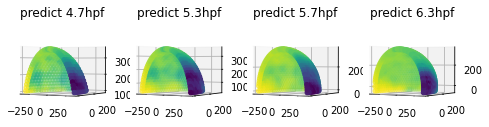

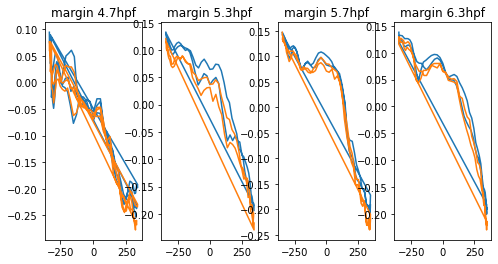

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


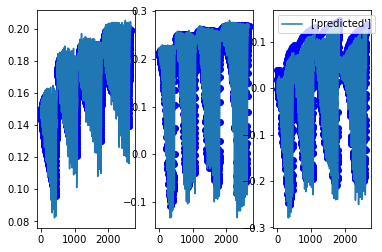

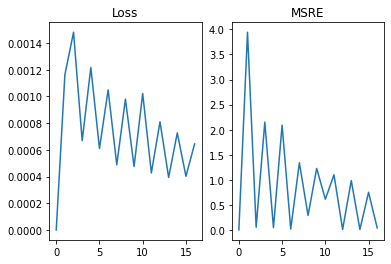

 48%|████▊     | 58/120 [00:03<00:03, 15.98it/s]

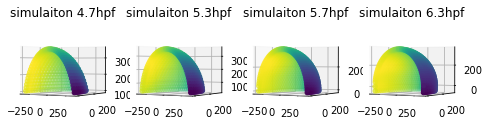

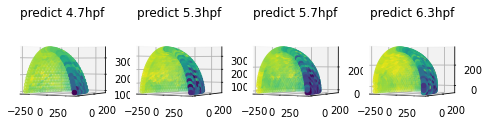

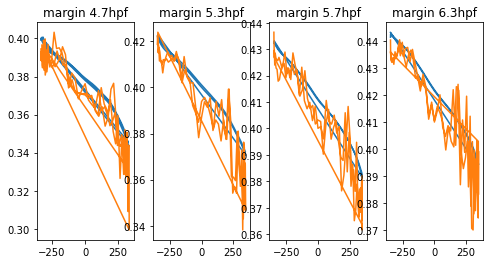

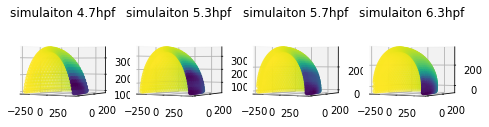

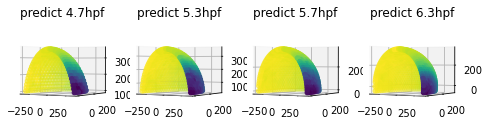

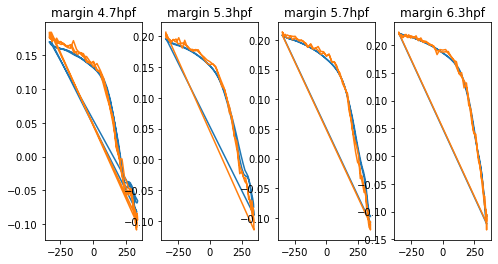

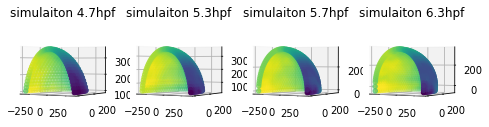

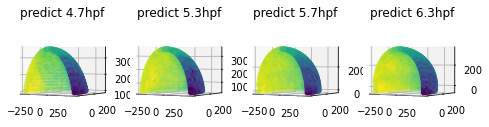

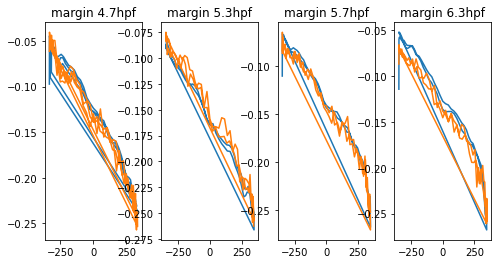

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


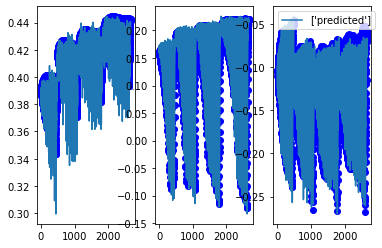

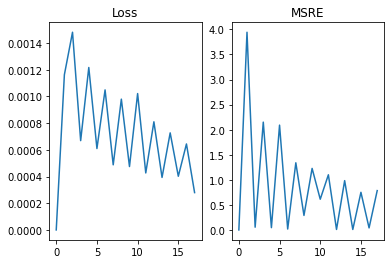

 98%|█████████▊| 118/120 [00:07<00:00, 15.57it/s]

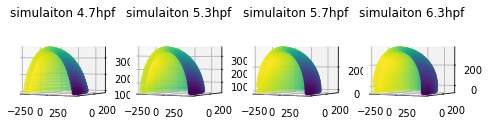

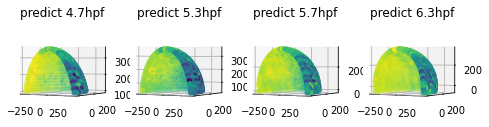

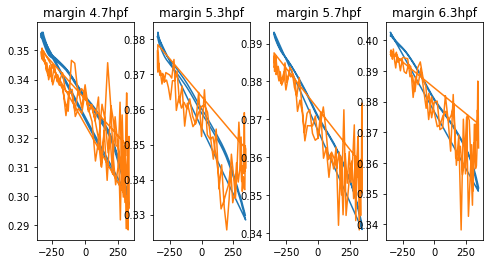

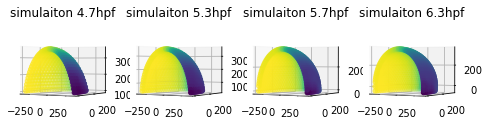

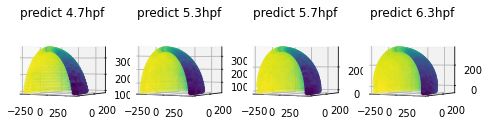

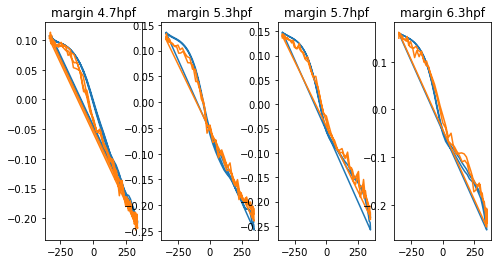

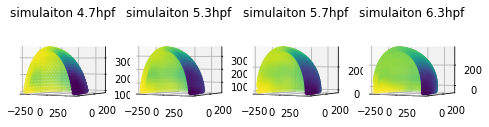

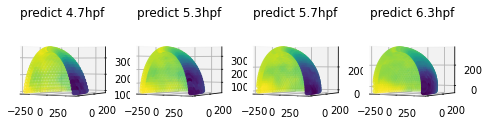

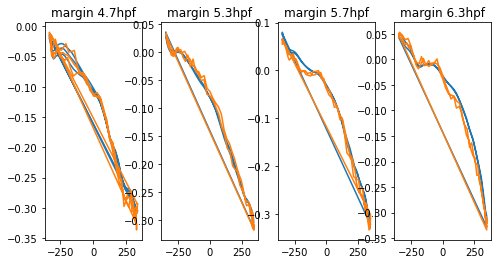

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


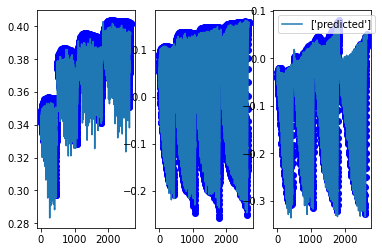

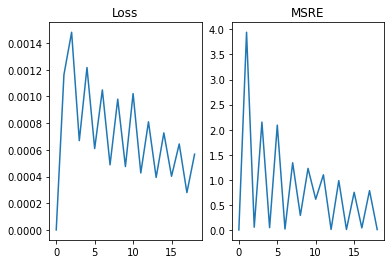

 48%|████▊     | 58/120 [00:03<00:04, 14.36it/s]

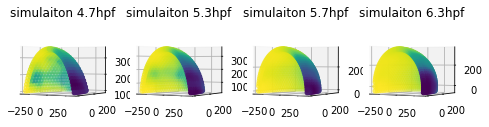

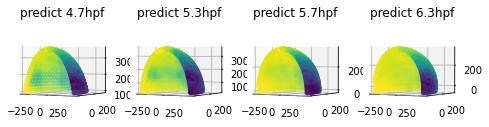

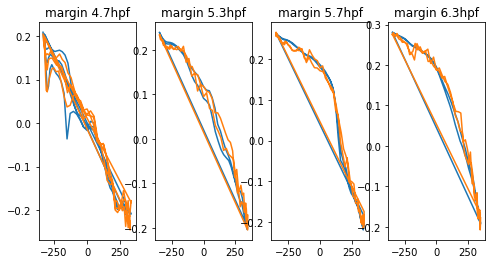

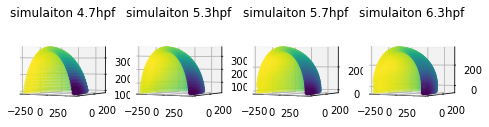

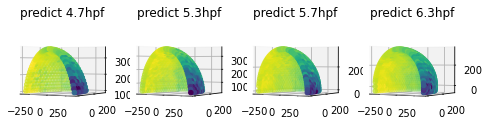

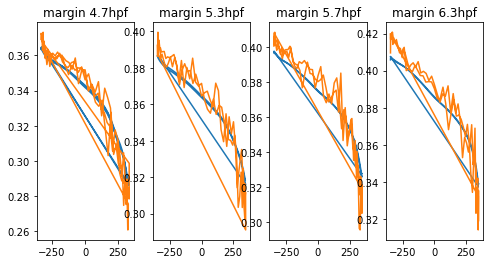

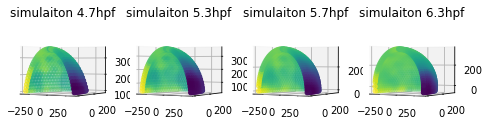

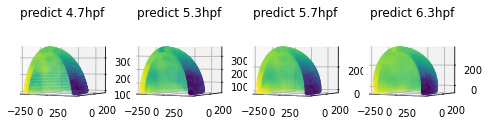

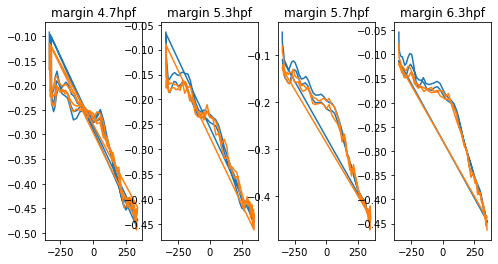

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


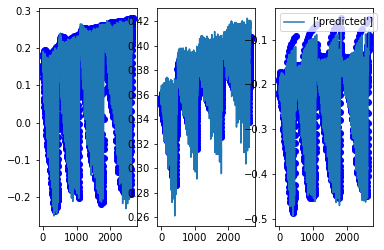

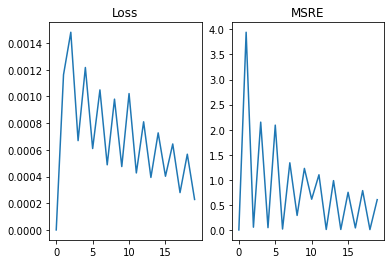

 98%|█████████▊| 118/120 [00:07<00:00, 16.08it/s]

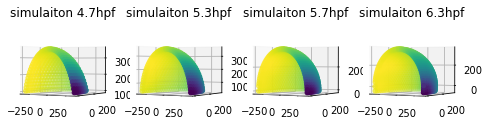

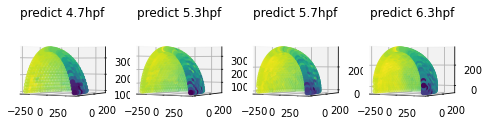

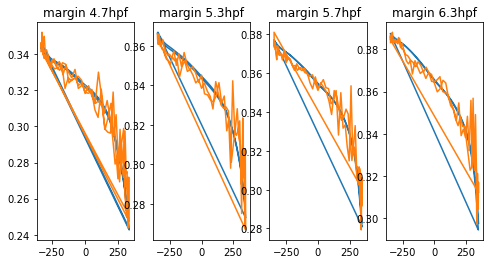

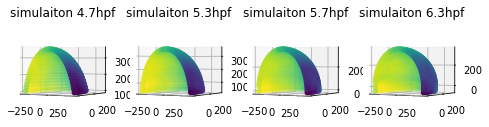

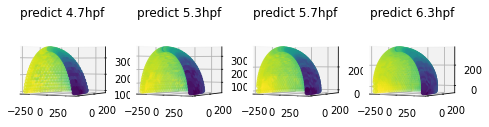

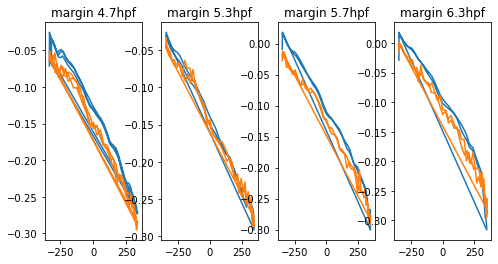

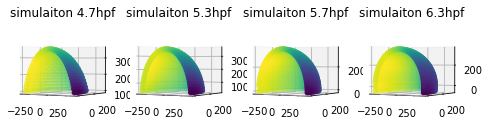

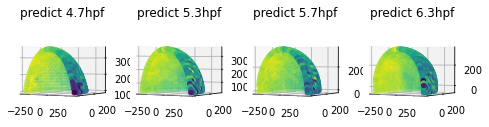

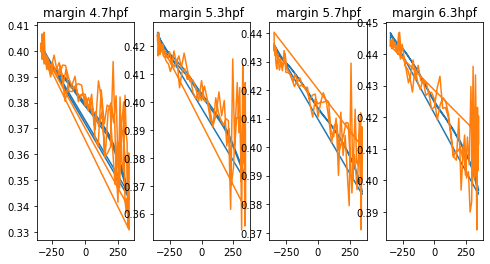

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


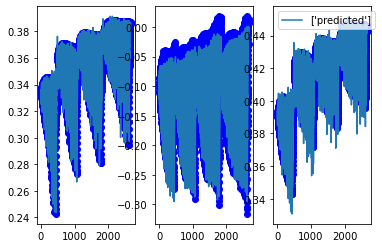

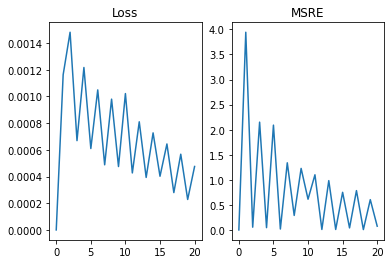

 48%|████▊     | 58/120 [00:03<00:03, 15.81it/s]

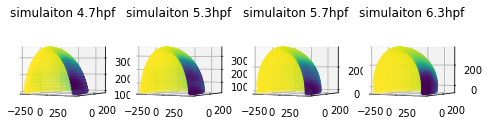

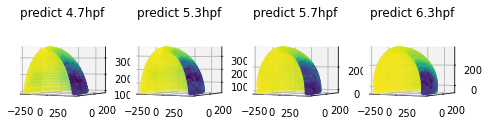

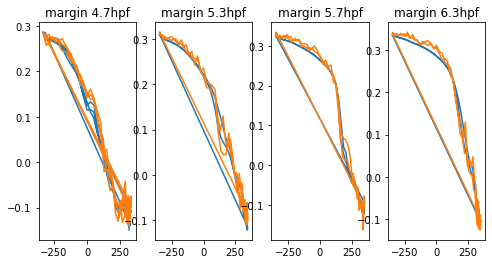

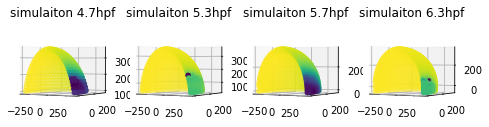

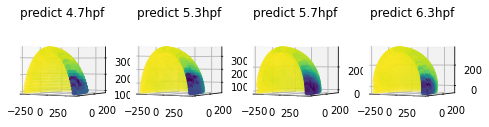

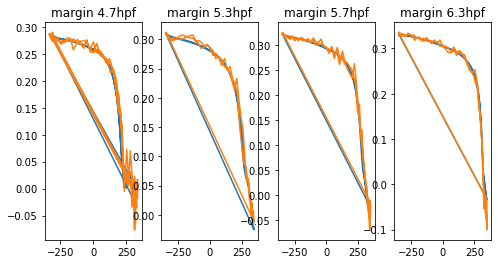

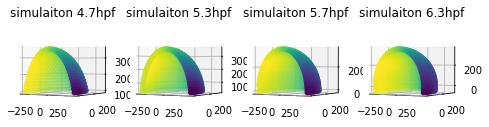

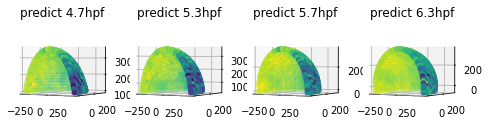

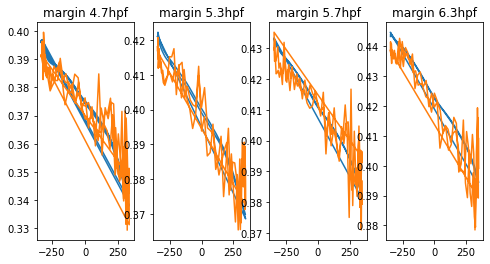

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


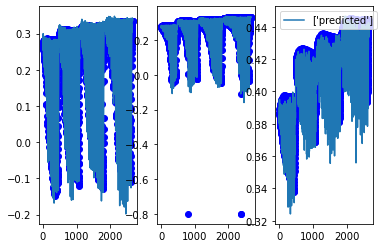

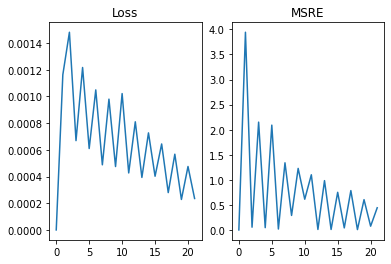

 98%|█████████▊| 118/120 [00:07<00:00, 15.60it/s]

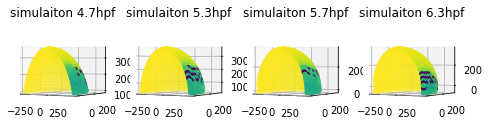

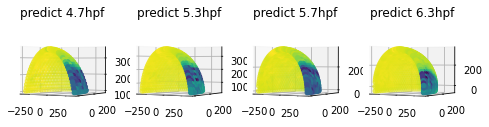

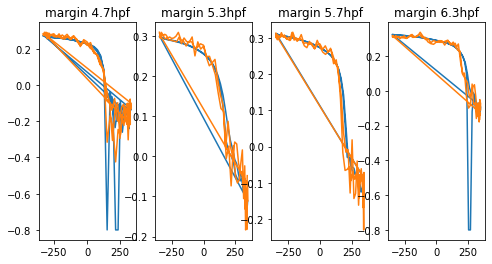

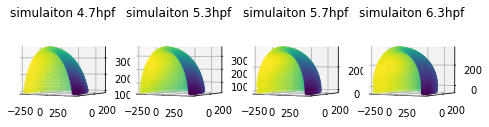

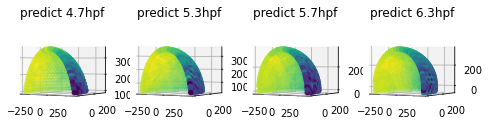

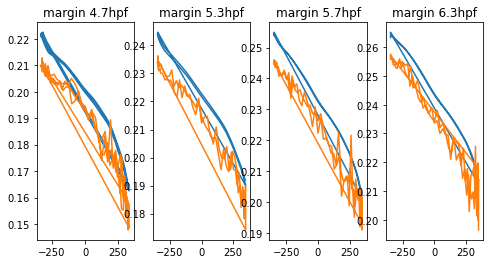

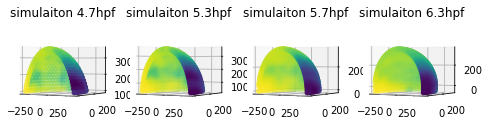

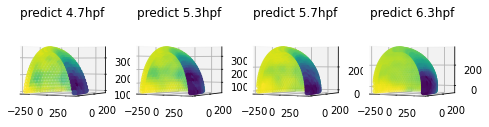

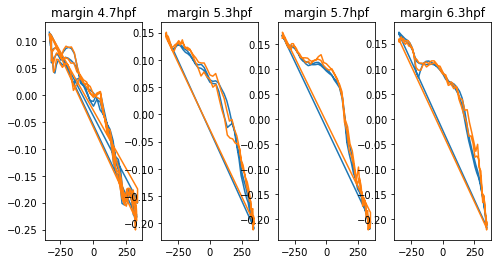

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


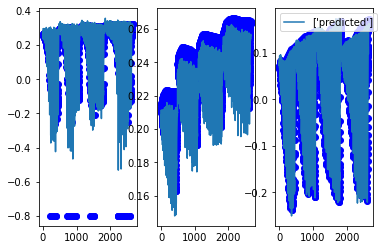

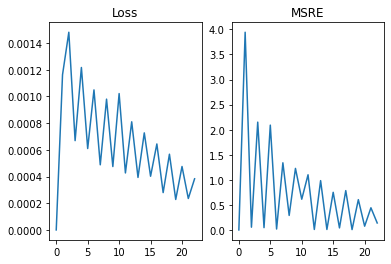

 48%|████▊     | 58/120 [00:03<00:04, 15.12it/s]

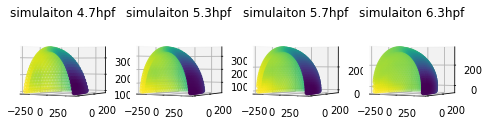

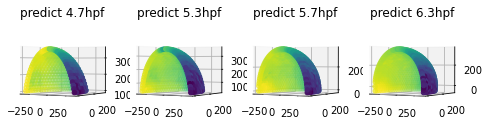

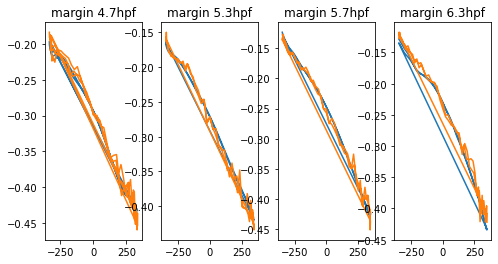

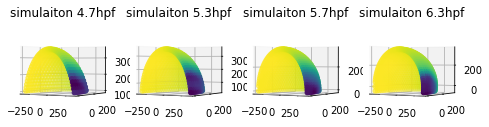

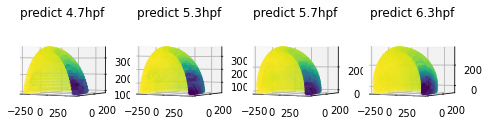

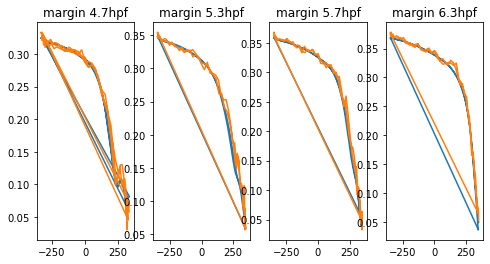

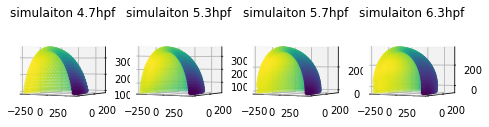

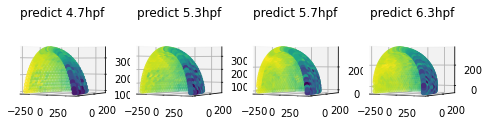

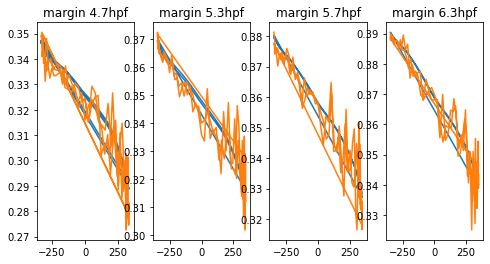

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


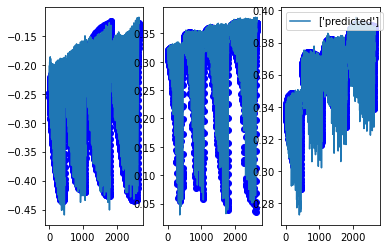

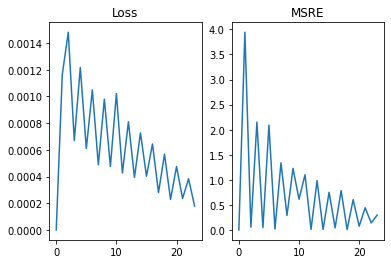

 98%|█████████▊| 118/120 [00:07<00:00, 15.35it/s]

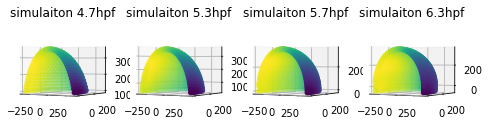

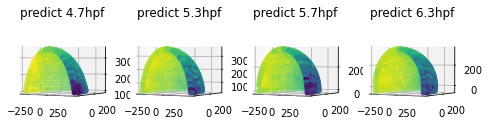

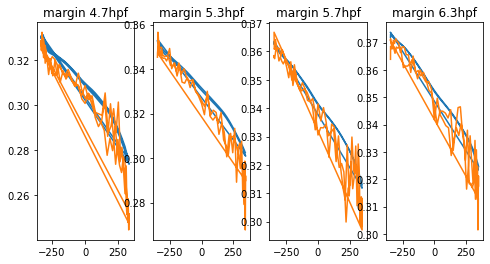

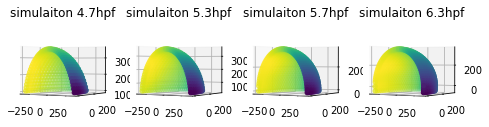

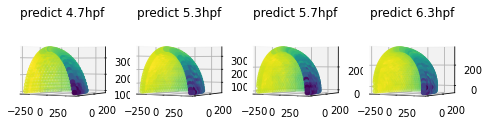

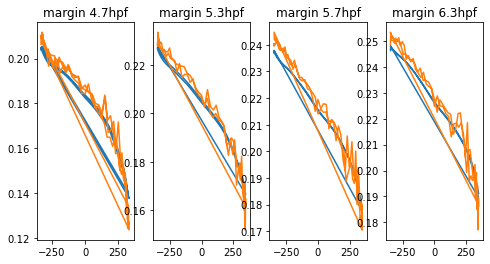

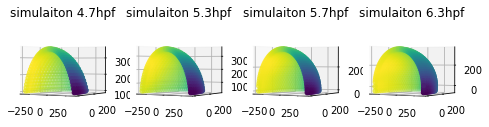

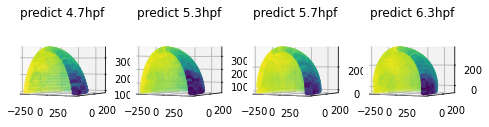

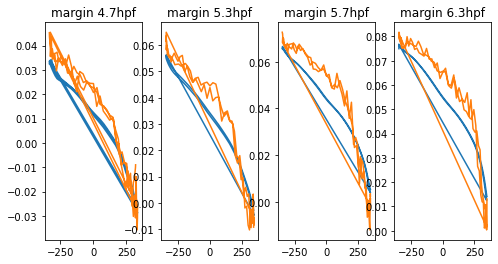

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


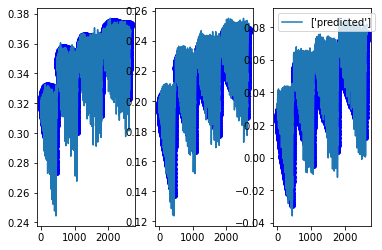

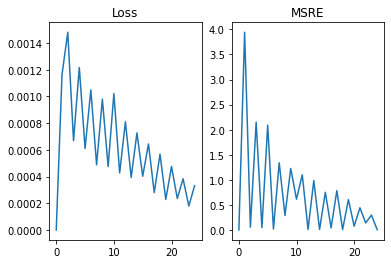

 48%|████▊     | 58/120 [00:03<00:04, 15.39it/s]

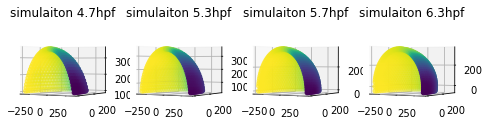

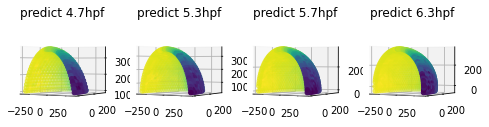

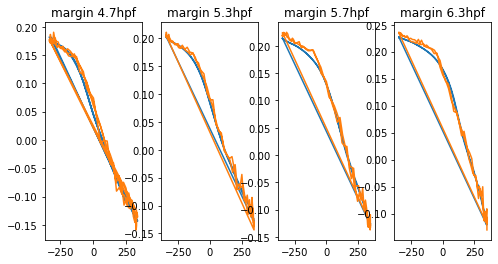

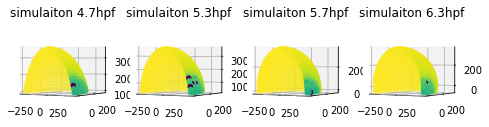

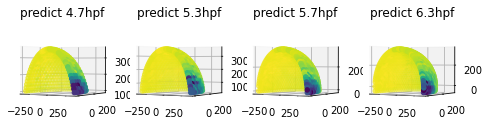

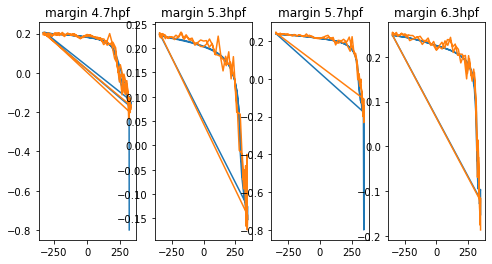

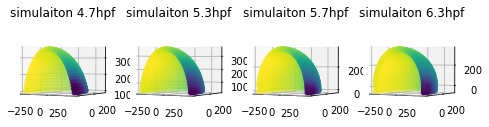

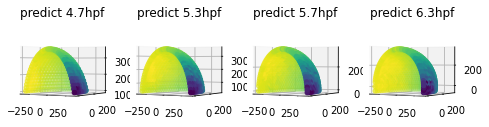

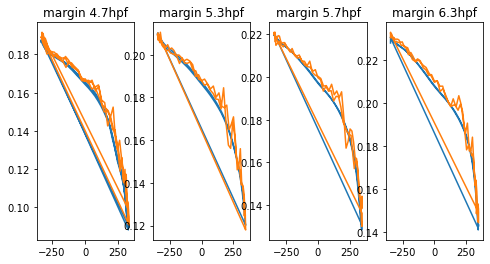

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


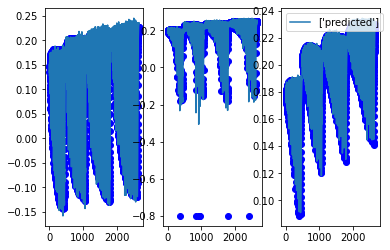

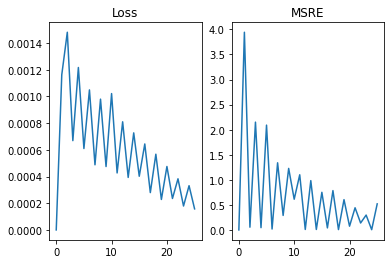

 98%|█████████▊| 118/120 [00:07<00:00, 15.60it/s]

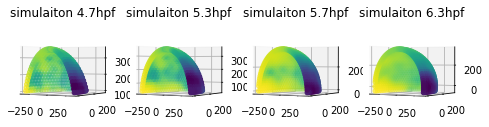

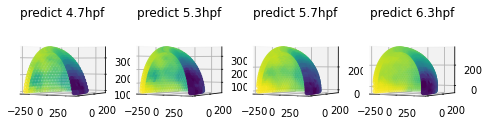

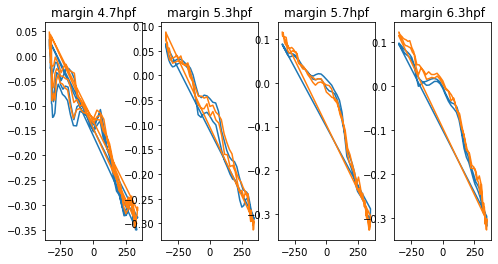

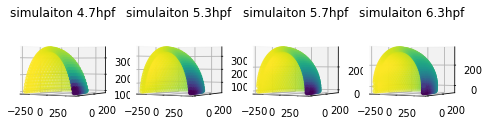

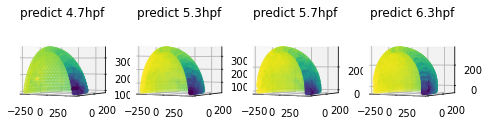

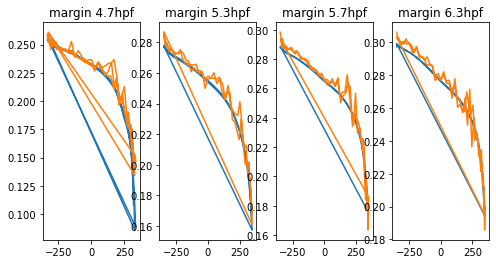

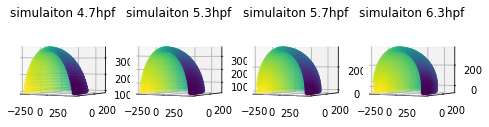

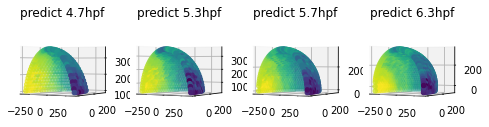

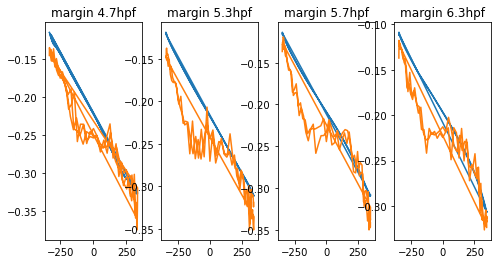

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


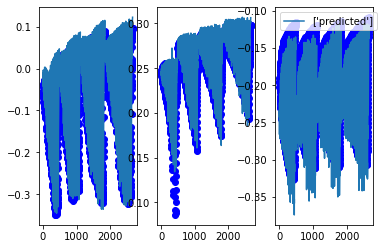

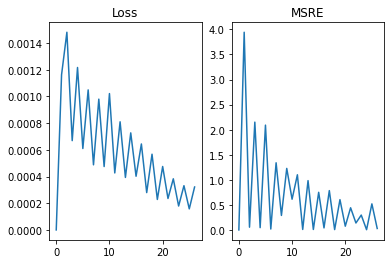

 48%|████▊     | 58/120 [00:03<00:03, 16.09it/s]

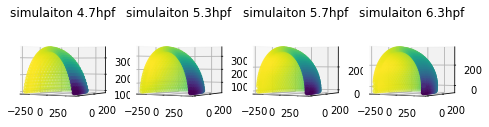

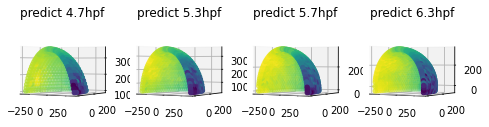

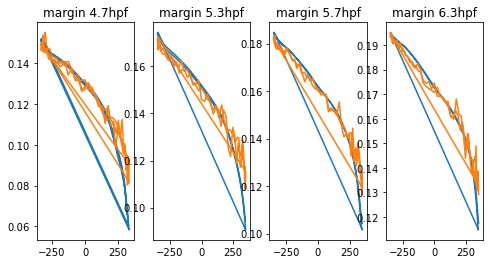

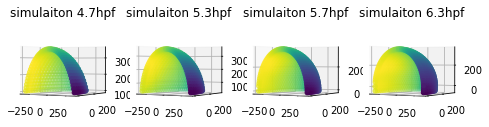

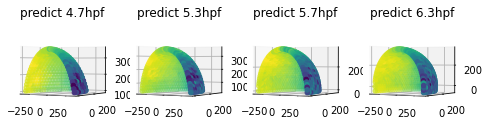

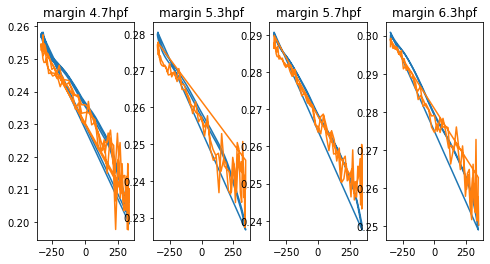

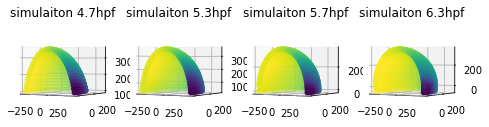

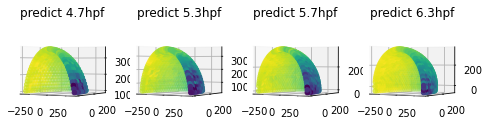

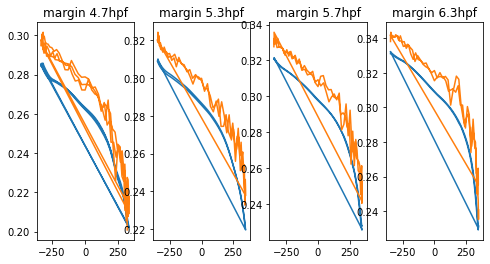

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


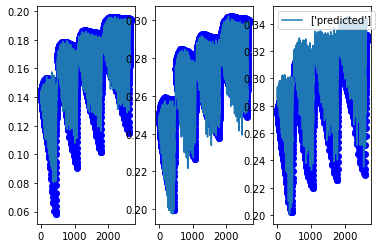

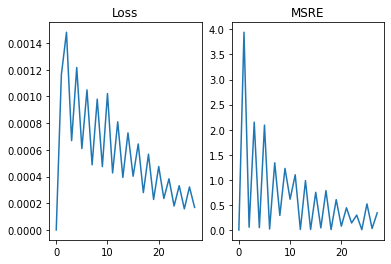

 98%|█████████▊| 118/120 [00:07<00:00, 15.53it/s]

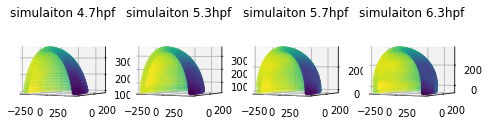

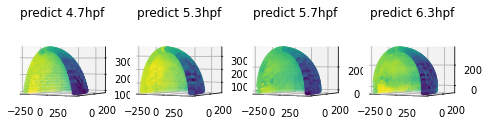

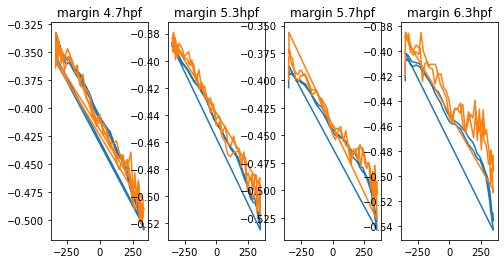

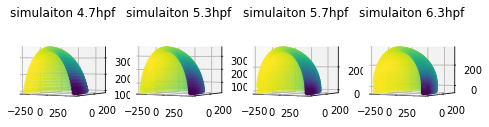

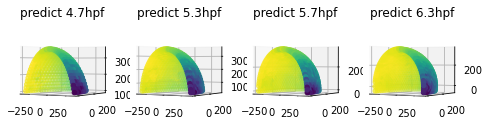

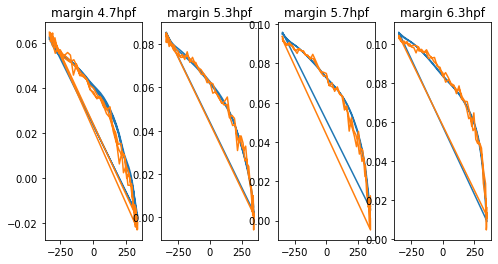

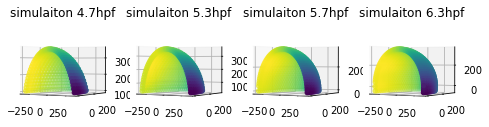

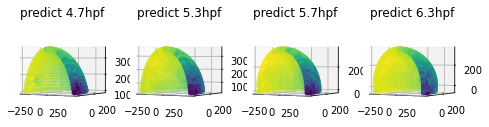

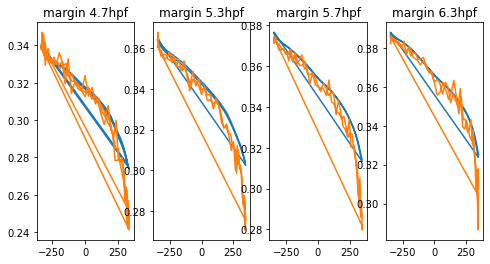

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


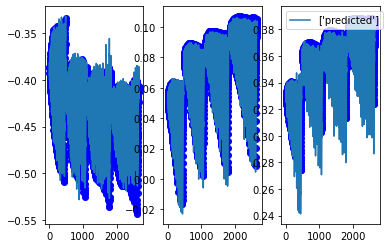

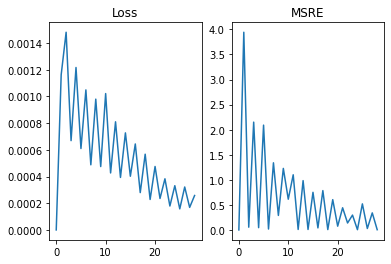

 48%|████▊     | 58/120 [00:03<00:03, 15.57it/s]

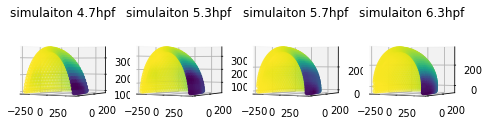

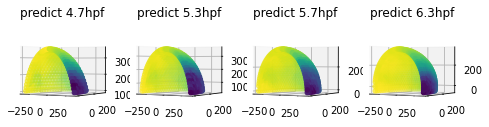

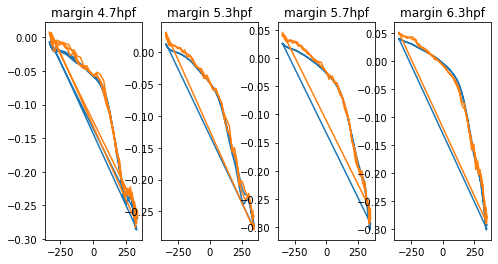

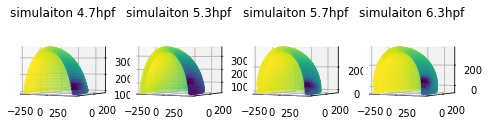

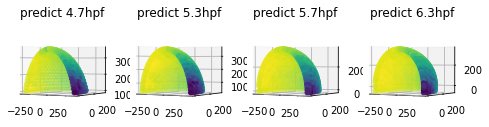

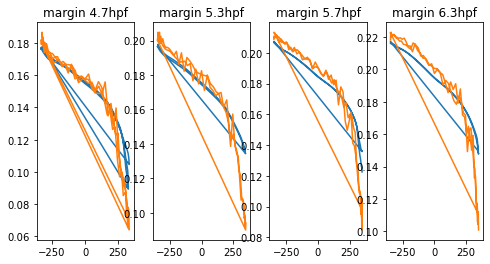

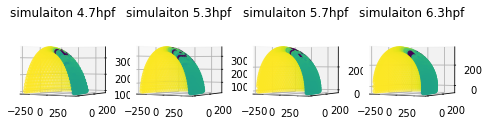

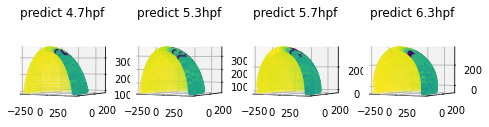

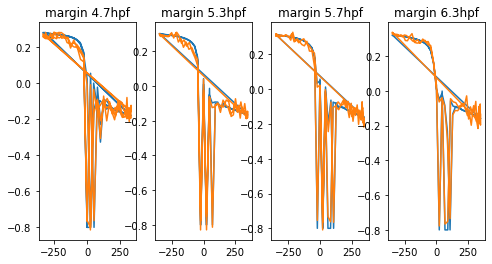

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


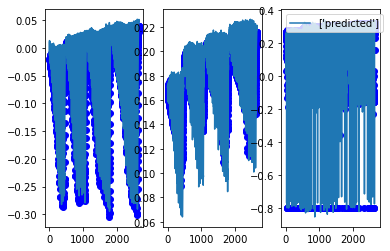

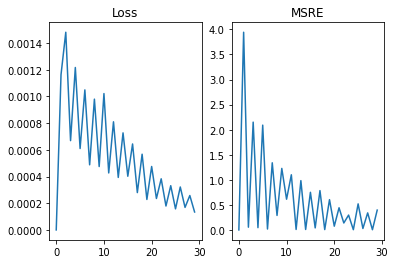

 98%|█████████▊| 118/120 [00:07<00:00, 15.44it/s]

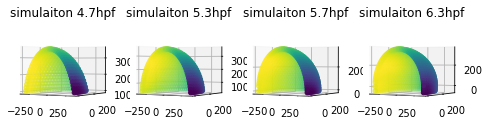

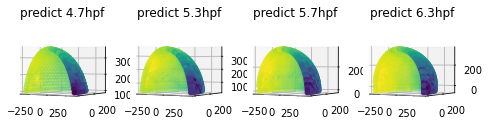

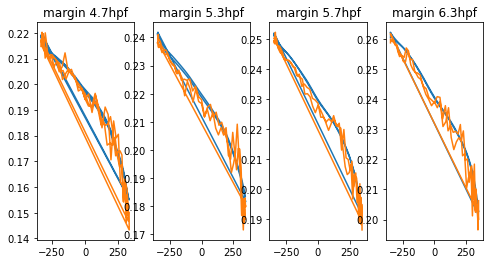

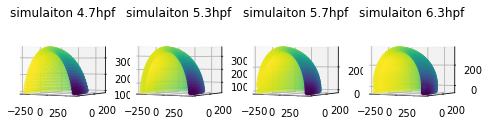

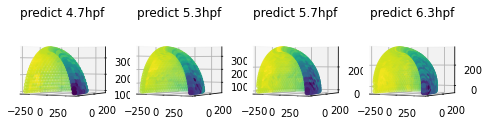

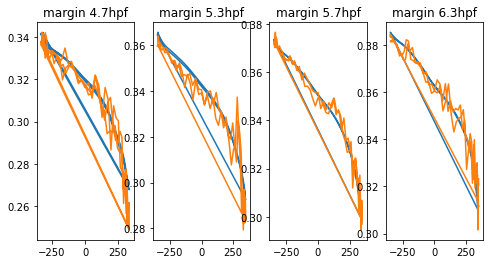

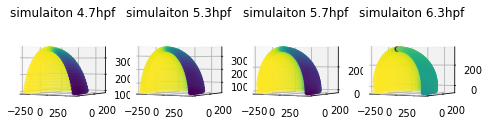

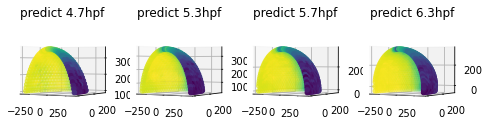

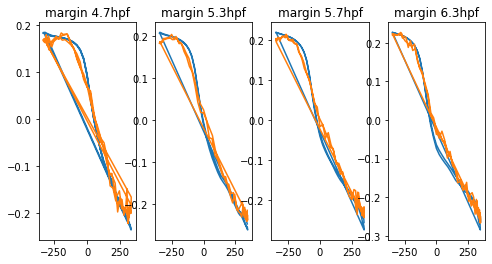

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


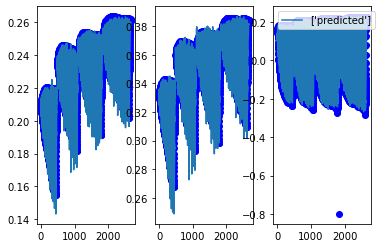

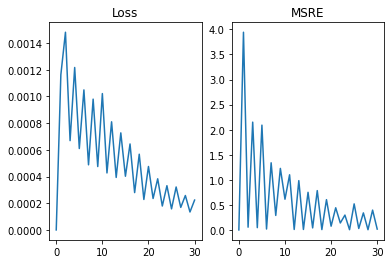

 48%|████▊     | 58/120 [00:03<00:03, 15.54it/s]

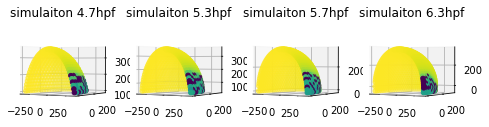

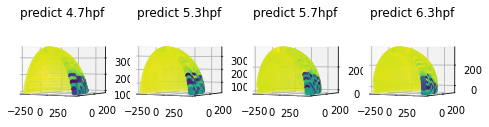

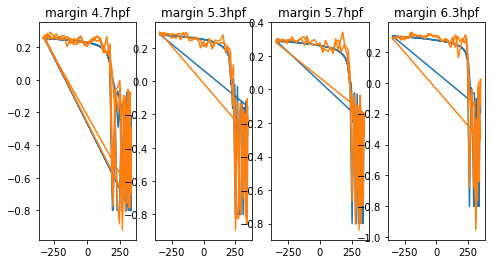

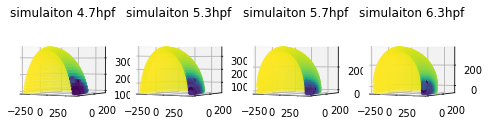

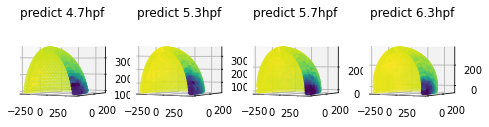

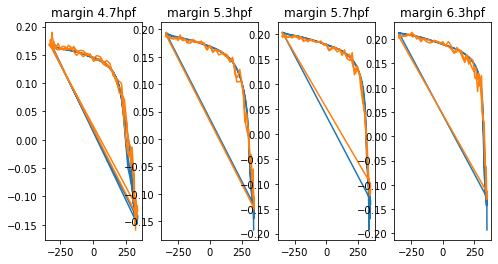

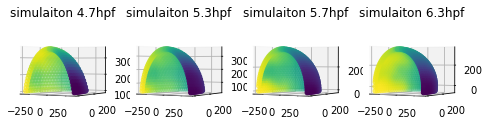

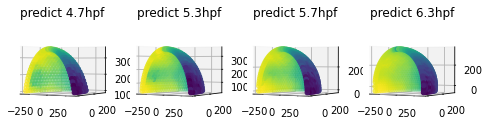

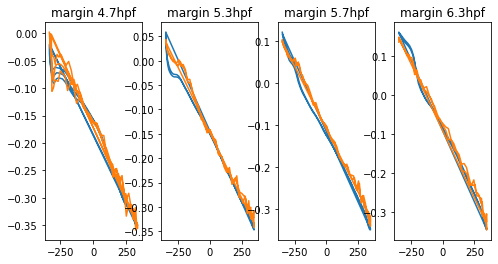

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


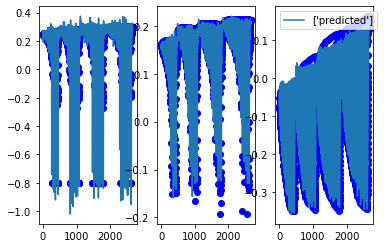

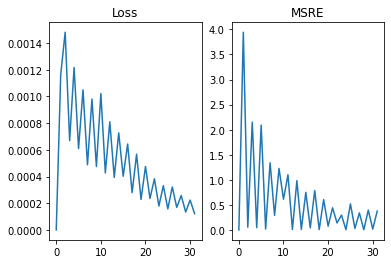

 98%|█████████▊| 118/120 [00:07<00:00, 15.83it/s]

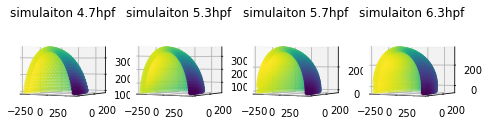

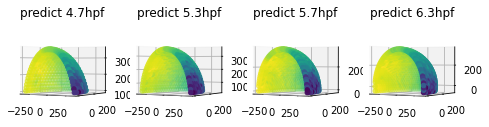

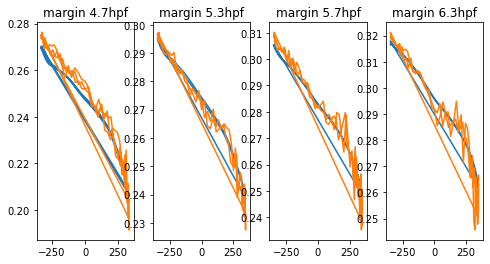

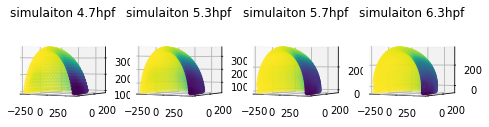

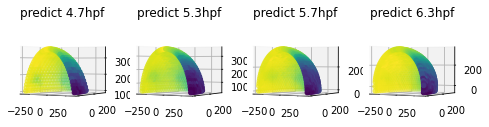

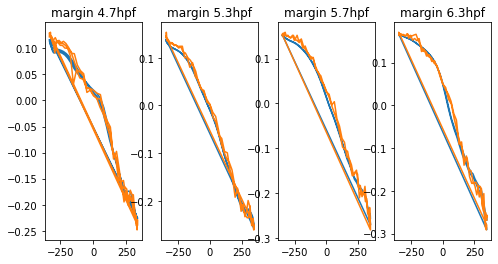

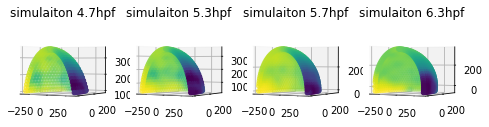

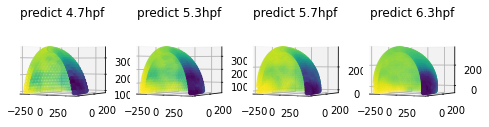

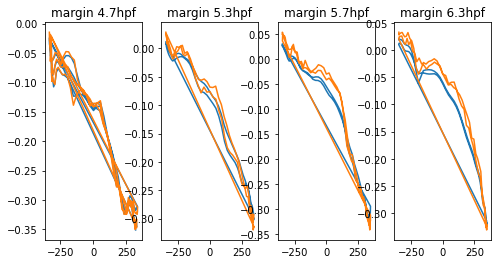

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


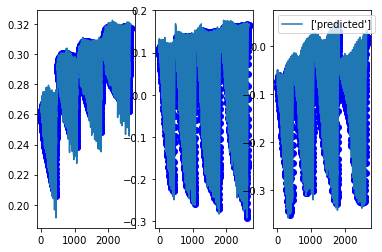

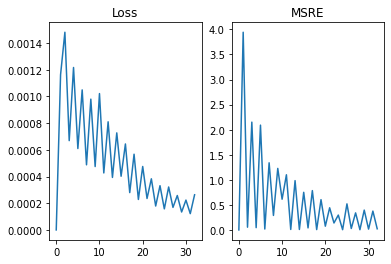

 48%|████▊     | 58/120 [00:03<00:04, 13.77it/s]

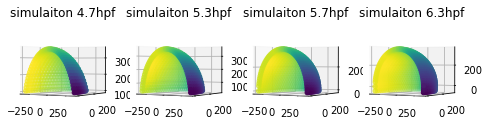

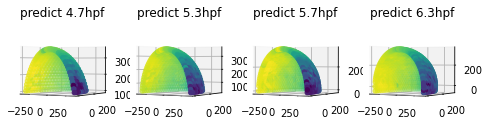

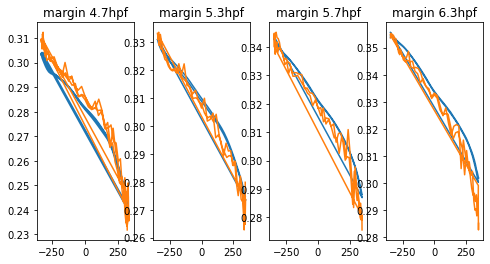

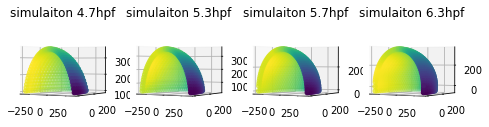

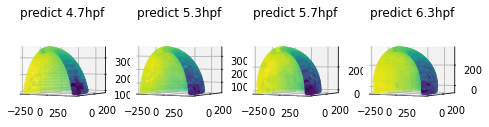

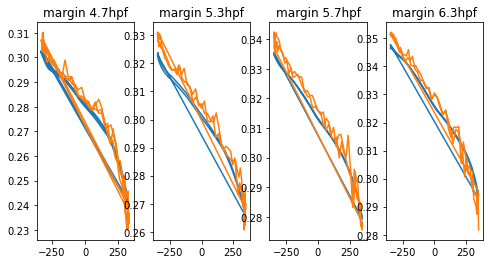

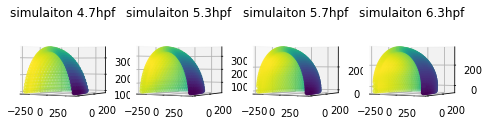

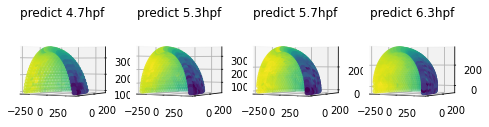

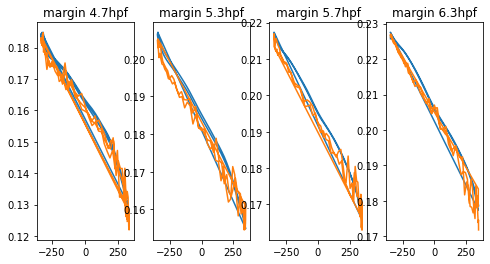

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


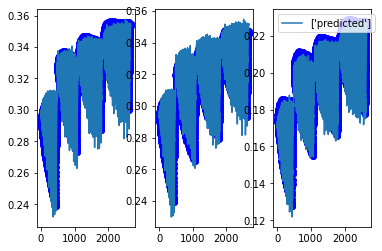

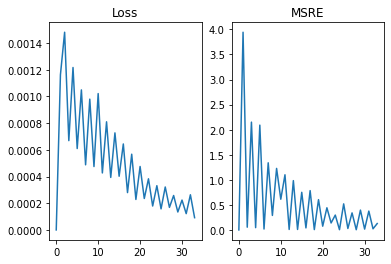

 98%|█████████▊| 118/120 [00:07<00:00, 15.87it/s]

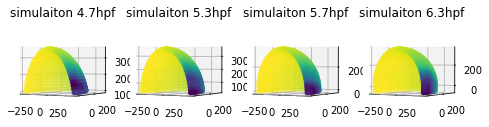

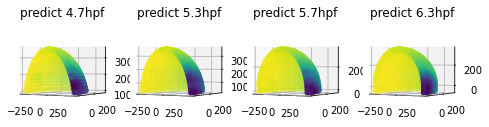

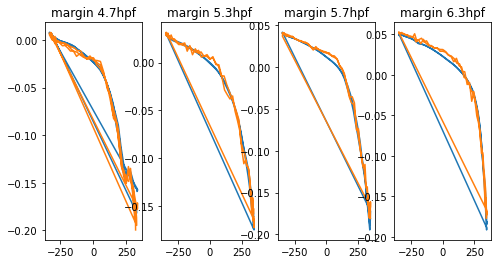

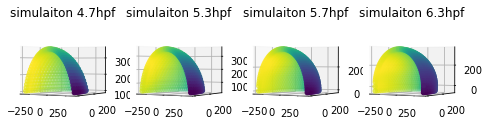

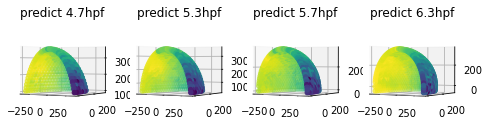

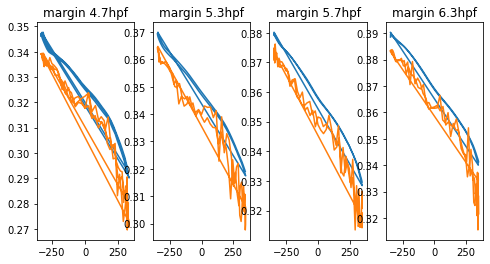

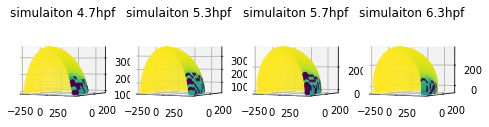

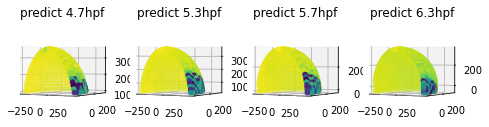

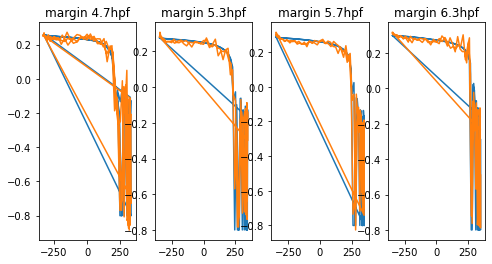

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


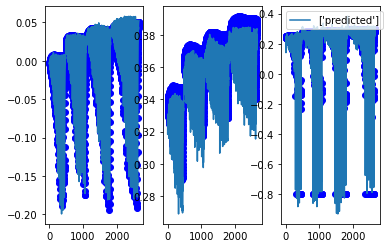

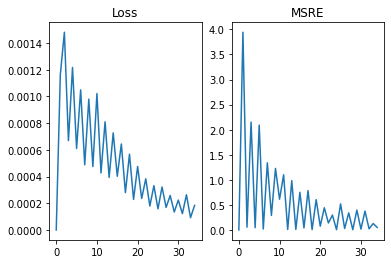

 48%|████▊     | 58/120 [00:03<00:03, 15.61it/s]

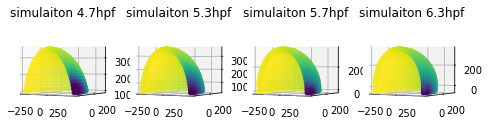

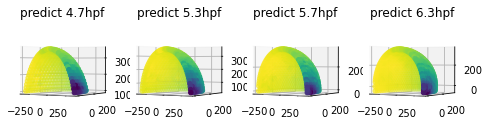

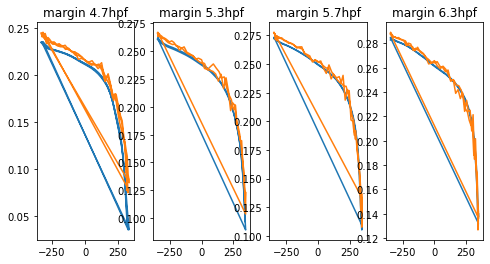

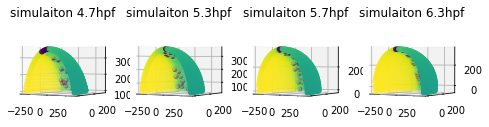

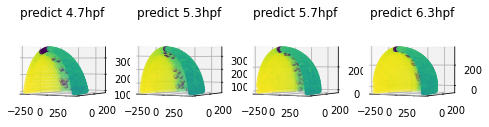

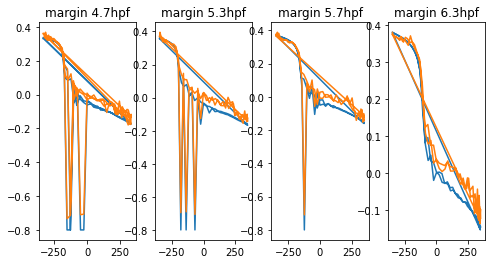

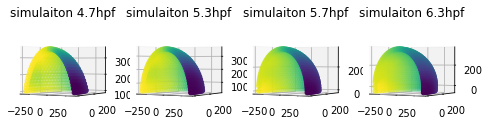

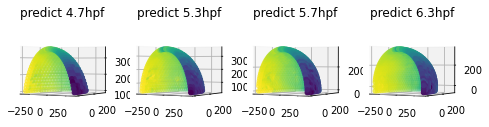

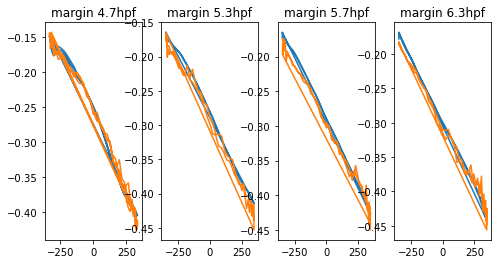

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


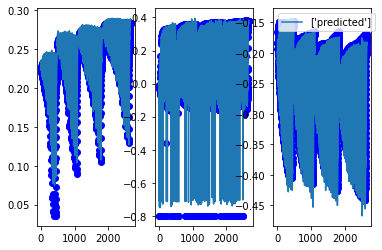

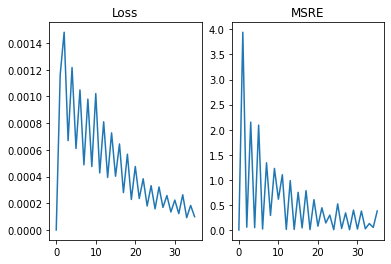

 98%|█████████▊| 118/120 [00:07<00:00, 15.49it/s]

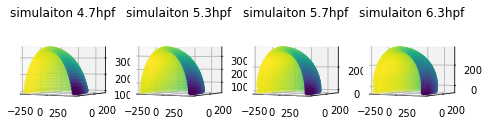

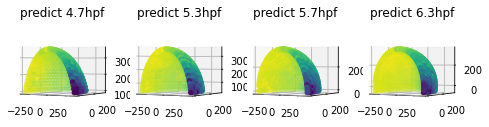

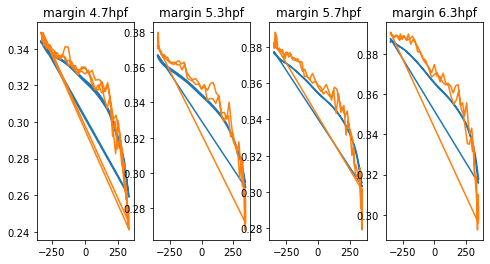

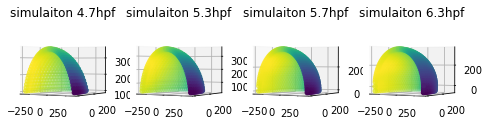

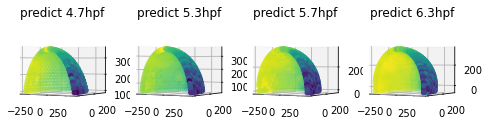

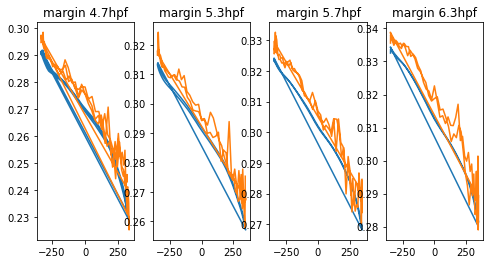

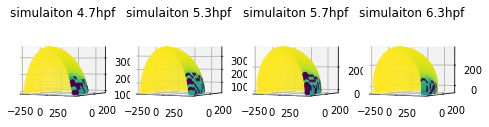

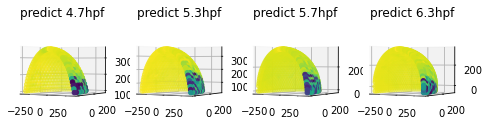

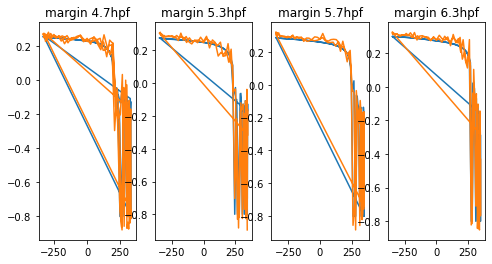

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


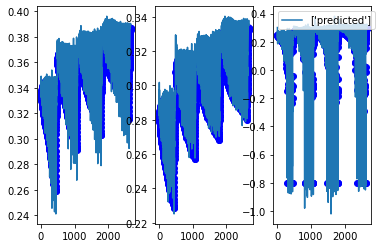

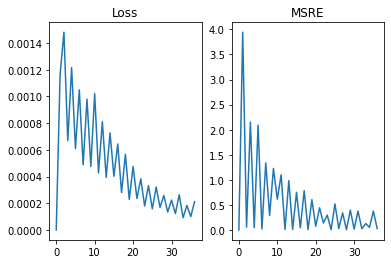

 48%|████▊     | 58/120 [00:03<00:04, 15.06it/s]

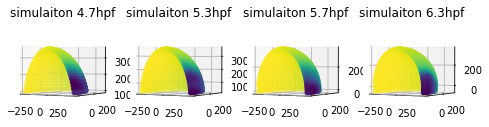

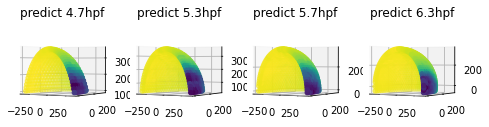

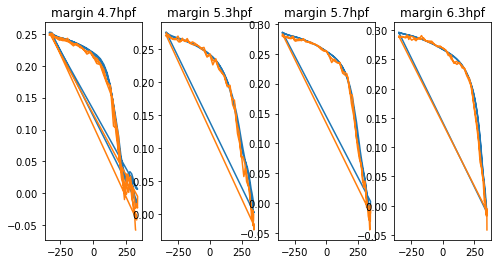

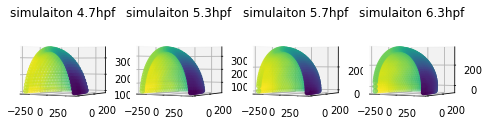

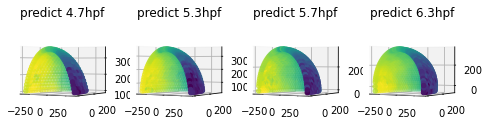

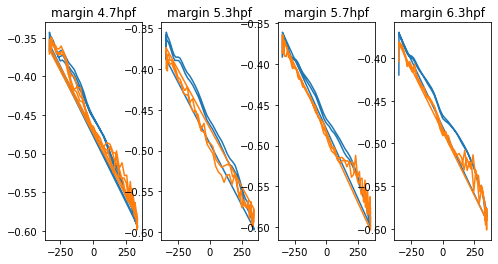

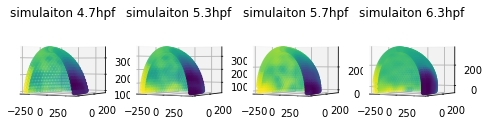

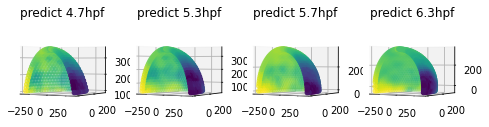

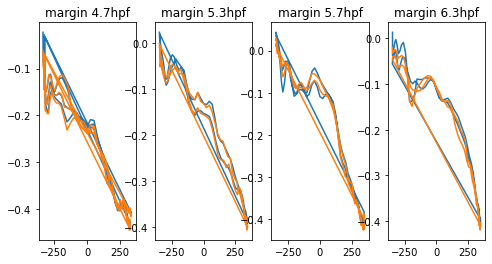

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


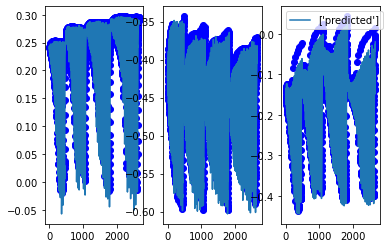

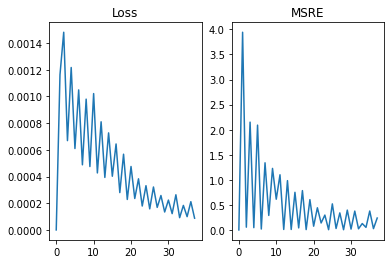

 98%|█████████▊| 118/120 [00:07<00:00, 15.70it/s]

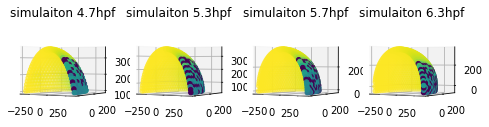

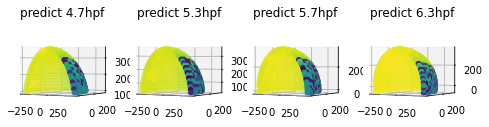

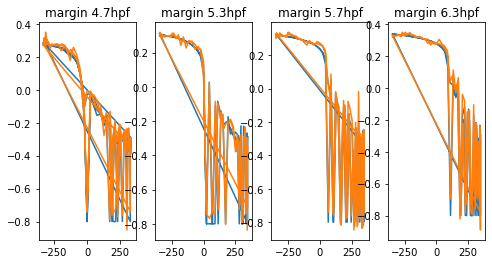

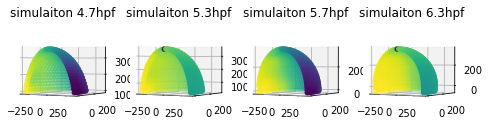

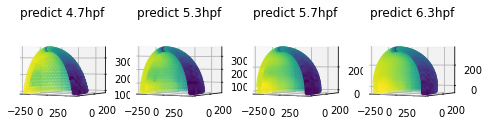

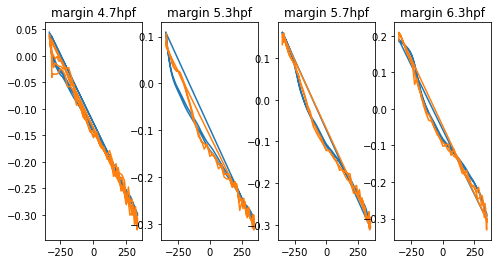

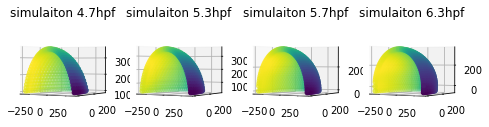

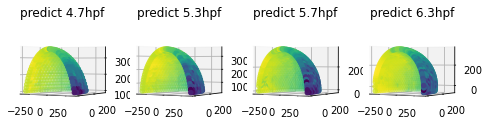

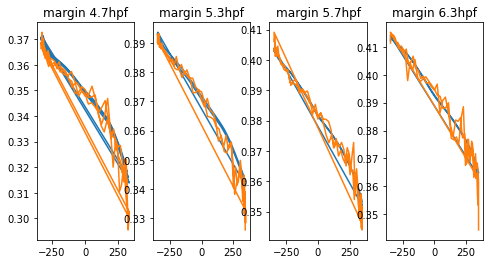

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


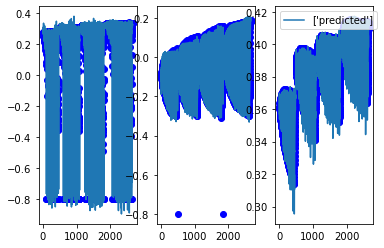

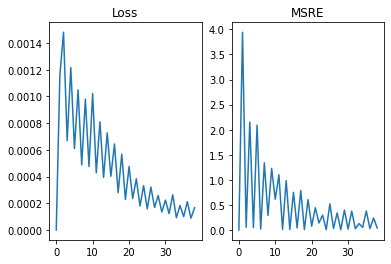

 48%|████▊     | 58/120 [00:03<00:03, 16.14it/s]

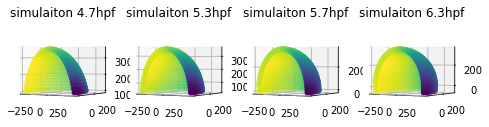

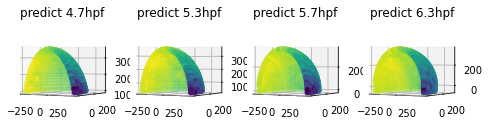

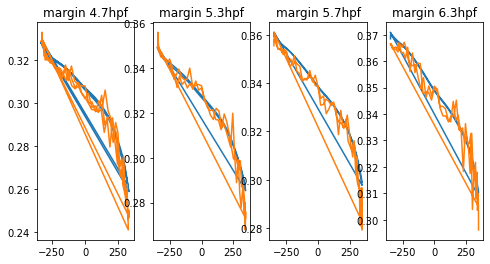

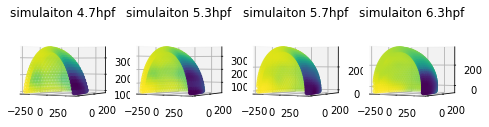

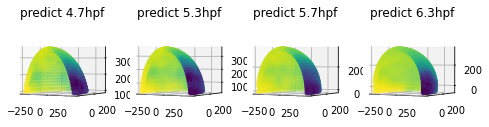

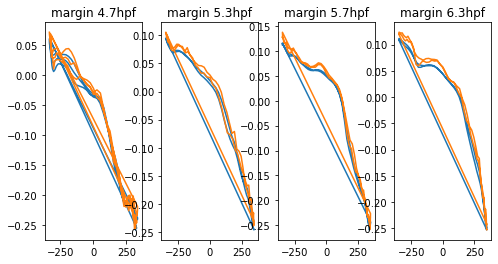

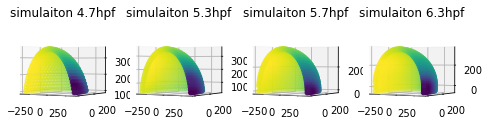

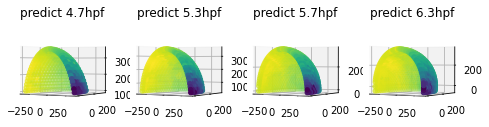

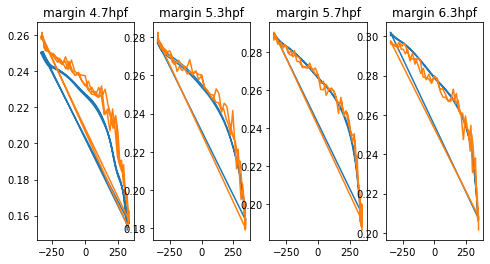

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


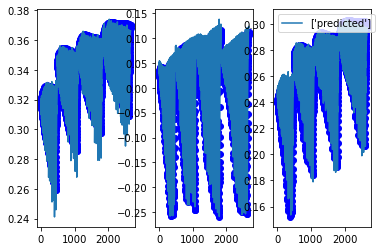

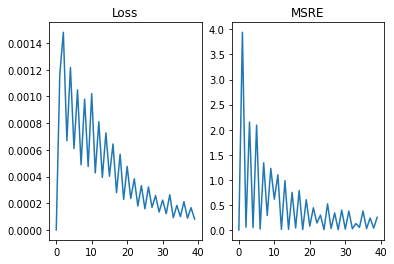

 98%|█████████▊| 118/120 [00:07<00:00, 15.78it/s]

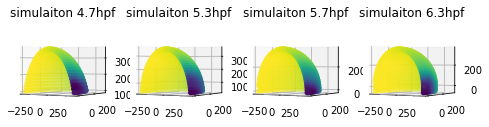

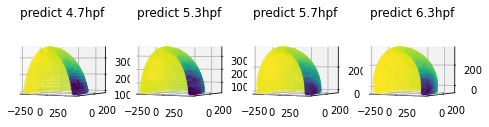

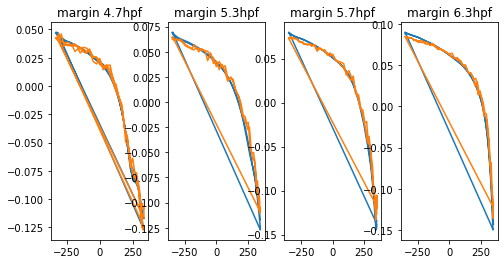

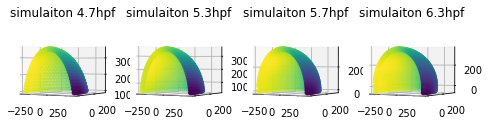

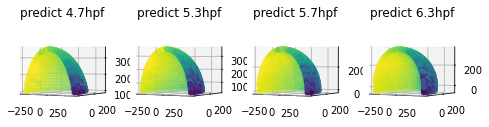

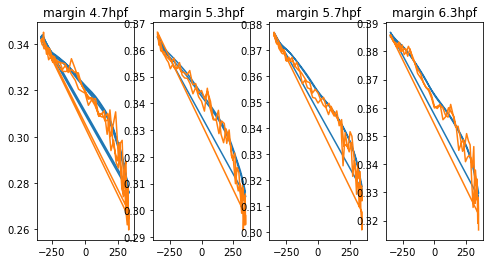

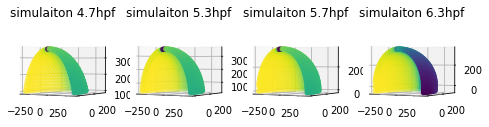

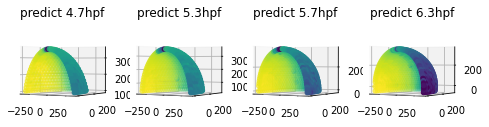

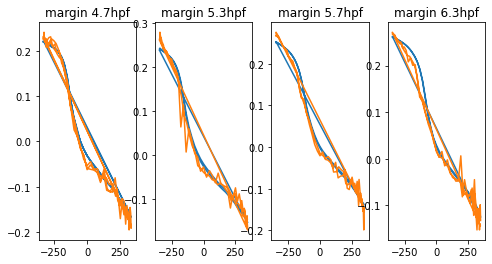

No handles with labels found to put in legend.
No handles with labels found to put in legend.


torch.Size([3, 2664])
2664
2664
2664


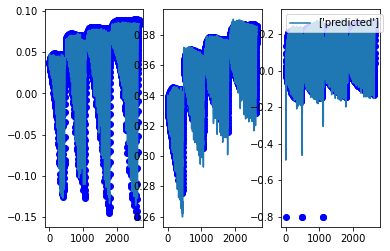

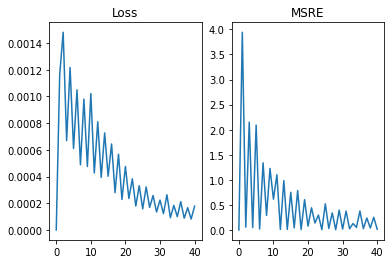

100%|██████████| 120/120 [00:10<00:00, 11.70it/s]


In [14]:
import argparse
import os
import random
import shutil
import time
import warnings
import numpy as np
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim
import torch.multiprocessing as mp
import torch.utils.data
from pathlib import Path
from scipy.io import loadmat
from tqdm.auto import tqdm



# setting up
epochs = 100
start_epoch = 0
lr = 0.001
batch_size = 64
momentum = 0.9
wd = 1e-4
p_freq = 300

resume = '' #resume ='resume'
evaluate=''
seed = 0

num_inputs = 27
num_outputs = 2664

cur_step = 0

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

best_score = -1000.0
# global total_loss
total_loss = np.array([0])
# print("Use GPU: {} for training".format(args.gpu))
total_ssres = np.array([0])

model_type = 2 # for simple model model_type ==1 ; for LSTM model model_type ==2 

# create model

model = ModelSimple(num_inputs, num_outputs)

# torch.cuda.set_device(args.gpu)
# model = model.cuda(args.gpu)
model = model.cpu()
# define loss function (criterion) and optimizer
# criterion = nn.L1Loss().cuda(args.gpu)
criterion = nn.MSELoss()
# criterion = nn.L1Loss().cpu()
#optimizer = torch.optim.SGD(model.parameters(), args.lr, momentum=args.momentum, weight_decay=args.weight_decay)
optimizer = torch.optim.Adam(model.parameters(), lr)
cudnn.benchmark = True

# Data loading code
print('Loading Training Data')
train_dataset = CSVdata( 'train_data_3D051222.csv', num_inputs, num_outputs)
print('Training Data input size')
print(train_dataset.input_par.size(1))
print('Training Data output size')
print(train_dataset.target.size(1))
print('Total Training pairs')
print(train_dataset.target.size(0))
val_dataset = CSVdata( 'val_data_3D051222.csv', num_inputs, num_outputs)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True)

print('Training Data loaded')

for epoch in range(start_epoch, epochs):
    
    #adjust_learning_rate(optimizer, epoch, args)

    # train for one epoch
    train(train_loader, model, criterion,optimizer, epoch,p_freq,model_type)




